In [1]:
projPath_load='/home/alvaro/notebook/jupyterenv/bin/TFM/DATA/dfA_n2_zone_aturat_index.csv'

In [2]:
projPath_save='/home/alvaro/notebook/jupyterenv/bin/TFM/DATA/'

In [3]:
month = '202206'
darsena = '_DM'

In [4]:
buffer_basin = 20 #m
buffer_dock = 30 #m
buffer_basin1 = 150 #m

min_points = 10

In [5]:
import numpy as np
import pandas as pd

import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
%matplotlib notebook

In [7]:
moll_map = gpd.read_file('/home/alvaro/notebook/jupyterenv/bin/TFM/22-23_Maniobres-20221022T161922Z-001/22-23_Maniobres/data/maps/MollsDarsenaMorrot_noTalo.shp')
dm_map = gpd.read_file('/home/alvaro/notebook/jupyterenv/bin/TFM/22-23_Maniobres-20221022T161922Z-001/22-23_Maniobres/data/maps/DarsenaMorrot.shp')

In [8]:
dm_map.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [9]:
dm_buffer = gpd.GeoDataFrame(geometry = dm_map.to_crs(32631).buffer(buffer_basin).to_crs(4326))
dm_buffer.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [10]:
dm_buffer_z2 = gpd.GeoDataFrame(geometry = dm_map.to_crs(32631).buffer(buffer_basin1).to_crs(4326))
dm_buffer_z2.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [11]:
moll_buffer = gpd.GeoDataFrame(geometry = moll_map.to_crs(32631).buffer(buffer_dock, cap_style = 2,join_style = 2).to_crs(4326))

<IPython.core.display.Javascript object>


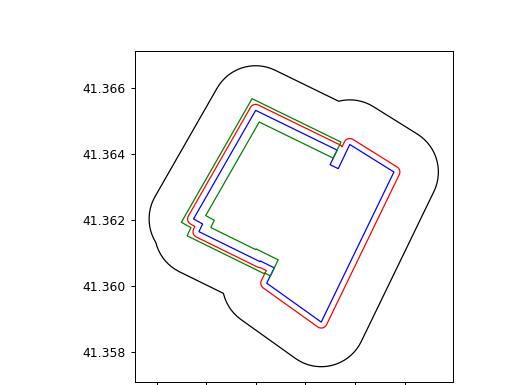

<AxesSubplot:>

In [12]:
fig, ax = plt.subplots()
dm_map.plot(ax = ax, fc = 'none', ec = 'blue')
dm_buffer.plot(ax = ax, fc = 'none', ec = 'red')
moll_buffer.plot(ax = ax, fc = 'none', ec = 'green')
dm_buffer_z2.plot(ax = ax, fc = 'none', ec = 'black')

# Load Data

In [13]:
dfA_n2=pd.read_csv(projPath_load)

In [14]:
len(dfA_n2)

57339

GEO DATA

In [15]:
gdfA_n2 = gpd.GeoDataFrame(dfA_n2[['mmsi','lon','lat', 'shiptype','zone']], geometry = gpd.points_from_xy(dfA_n2.lon, dfA_n2.lat),crs = dm_map.crs)

In [16]:
len(gdfA_n2)

57339

In [17]:
dfA_n2.head()

,time_stamp,mmsi,status,turn,speed,lon,lat,course,heading,day,...,shiptype,draught,to_bow,to_stern,to_starboard,to_port,imo,zone,aturat,entsort
0,2022-06-01 01:03:59,247383500,0,-6.0,34.0,2.17667,41.35834,26.1,25.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
1,2022-06-01 01:04:10,247383500,0,-7.0,33.0,2.17678,41.35849,25.9,25.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
2,2022-06-01 01:04:20,247383500,0,-7.0,33.0,2.17686,41.35864,25.5,24.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
3,2022-06-01 01:04:30,247383500,0,-8.0,33.0,2.17695,41.35878,25.3,24.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
4,2022-06-01 01:04:40,247383500,0,-9.0,32.0,2.17704,41.35892,25.1,23.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN


# FUNCTION DEFINITION

In [18]:
def fortest (df):
    dft=df.loc[(df['entsort']=='ent')|(df['entsort']=='sort') ,:].copy()
    for elm in range (0, df.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA_n2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')
        sns.scatterplot(data = dfA_n2.loc[r1:r2,:], x = 'time_stamp',y = 'speed', s = 100, hue = 'variable', palette = 'hsv')

# LAUNCH GROUPBY

In [19]:
dfA_n2.mmsi.unique()

array([247383500, 247383600, 247219400, 247383400, 247243600, 247383300,
       209115000, 210117000])

##  247383500

In [20]:
dfAmmsi=dfA_n2.groupby('mmsi')

In [21]:
dfA1b1=dfAmmsi.get_group(247383500).copy()

289:478 SPEED


<IPython.core.display.Javascript object>


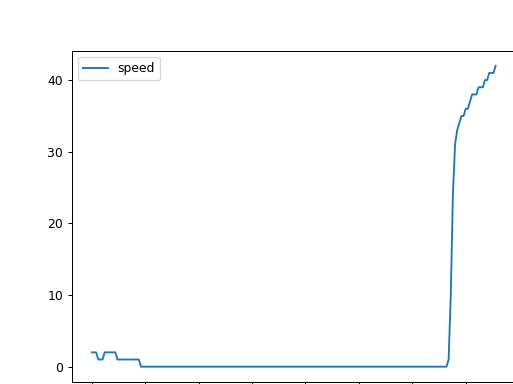

6078:6538 SPEED


<IPython.core.display.Javascript object>


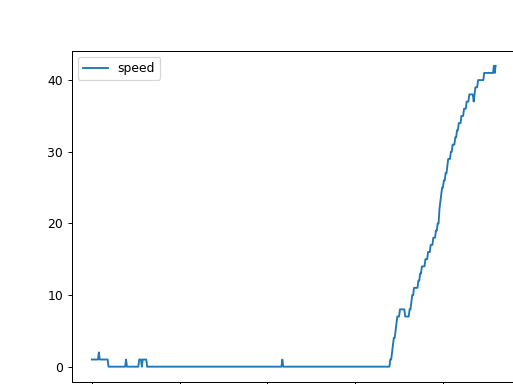

11994:12193 SPEED


<IPython.core.display.Javascript object>


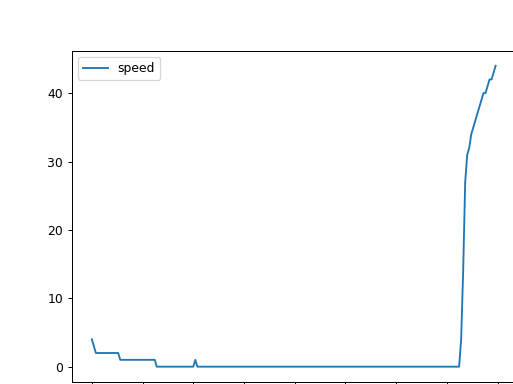

15592:15875 SPEED


<IPython.core.display.Javascript object>


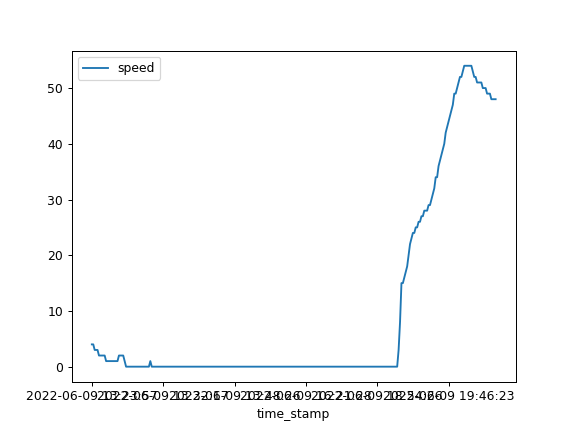

31014:31268 SPEED


<IPython.core.display.Javascript object>


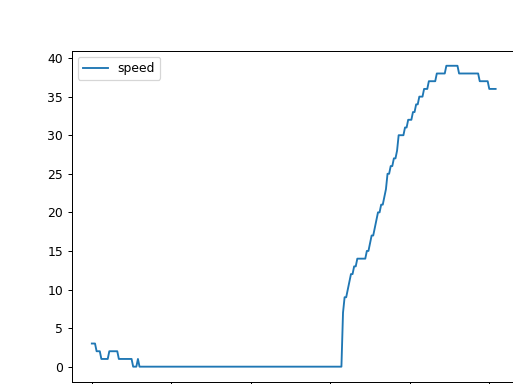

33229:33522 SPEED


<IPython.core.display.Javascript object>


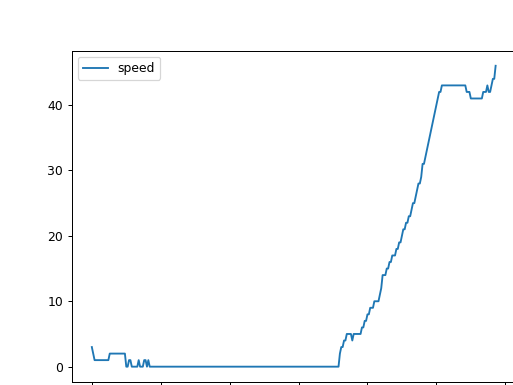

38562:38832 SPEED


<IPython.core.display.Javascript object>


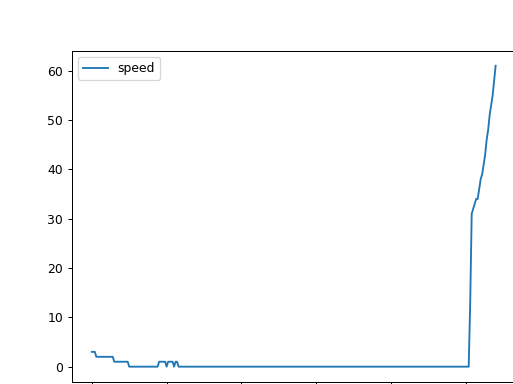

41211:41431 SPEED


<IPython.core.display.Javascript object>


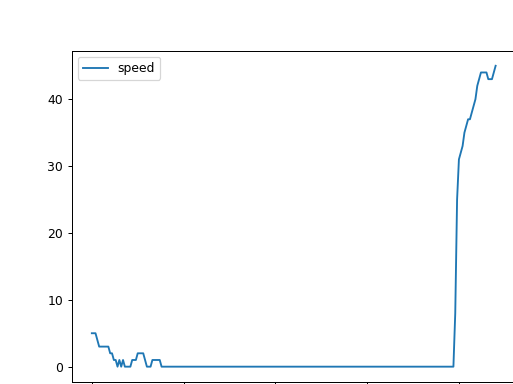

46755:46996 SPEED


<IPython.core.display.Javascript object>


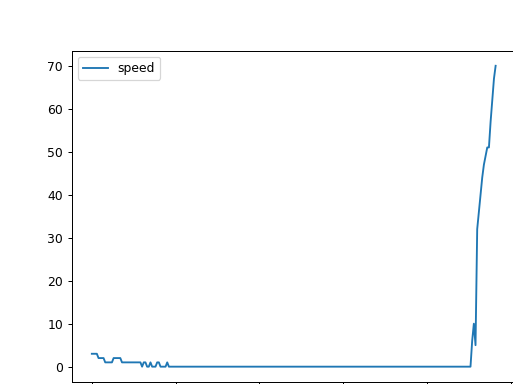

50238:50499 SPEED


<IPython.core.display.Javascript object>


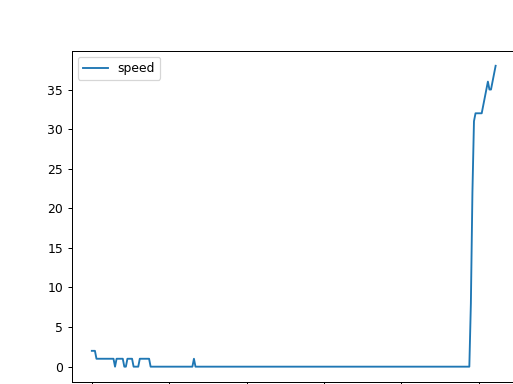

56708:57073 SPEED


<IPython.core.display.Javascript object>


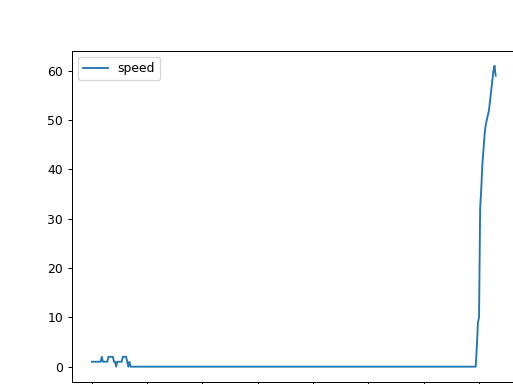

In [24]:
dft=dfA1b1.loc[(dfA1b1['entsort']=='ent')|(dfA1b1['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b1.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

289:478 SPEED


<IPython.core.display.Javascript object>


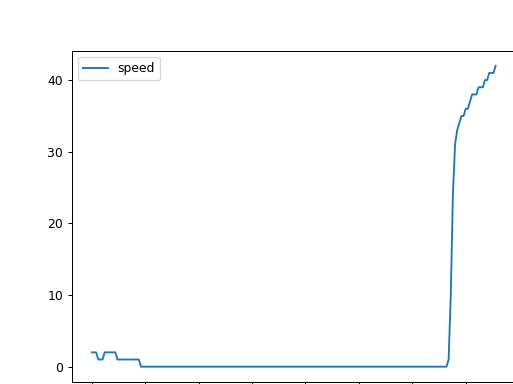

6078:6538 SPEED


<IPython.core.display.Javascript object>


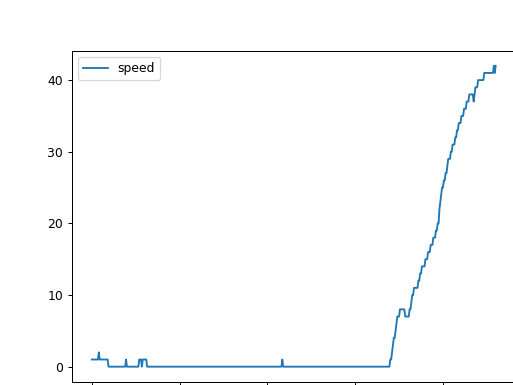

11994:12193 SPEED


<IPython.core.display.Javascript object>


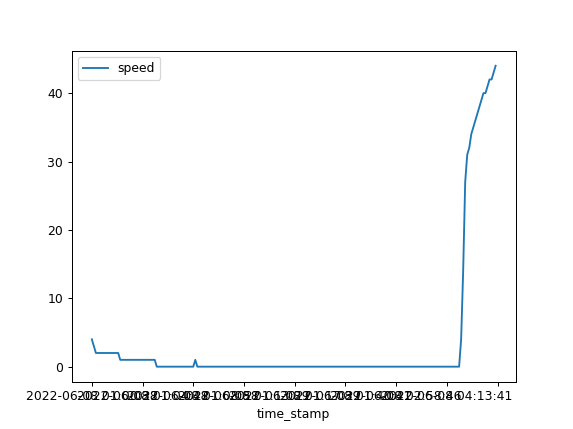

15592:15875 SPEED


<IPython.core.display.Javascript object>


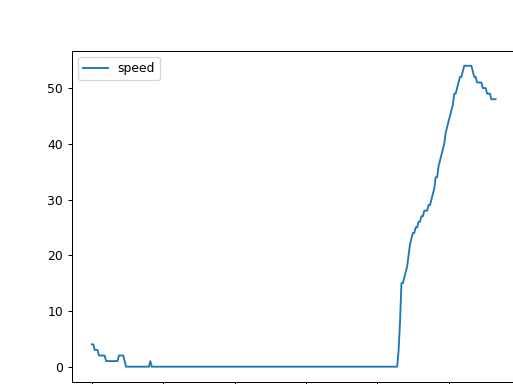

31014:31268 SPEED


<IPython.core.display.Javascript object>


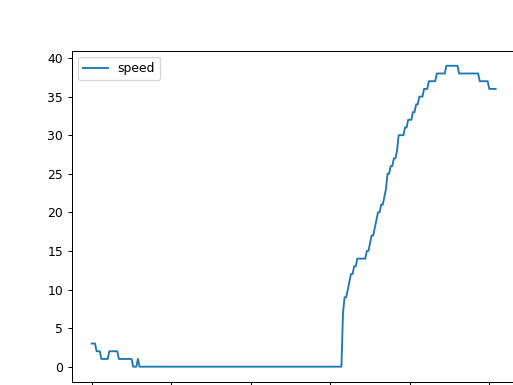

33229:33522 SPEED


<IPython.core.display.Javascript object>


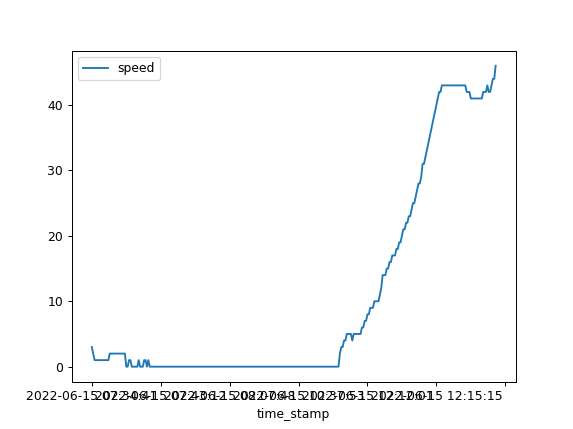

38562:38832 SPEED


<IPython.core.display.Javascript object>


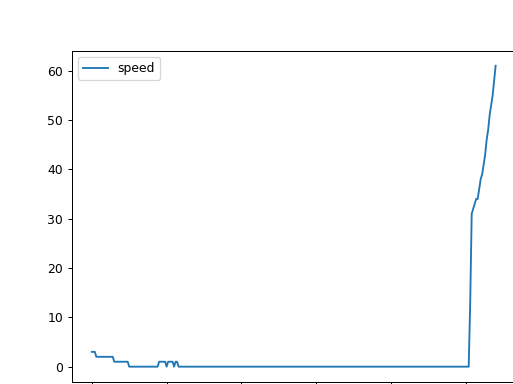

41211:41431 SPEED


<IPython.core.display.Javascript object>


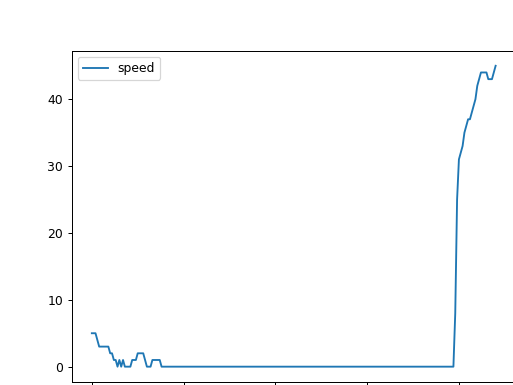

46755:46996 SPEED


<IPython.core.display.Javascript object>


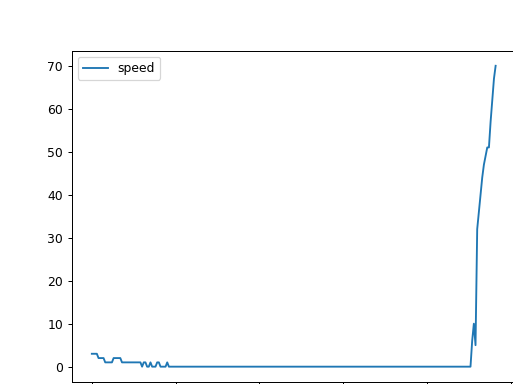

50238:50499 SPEED


<IPython.core.display.Javascript object>


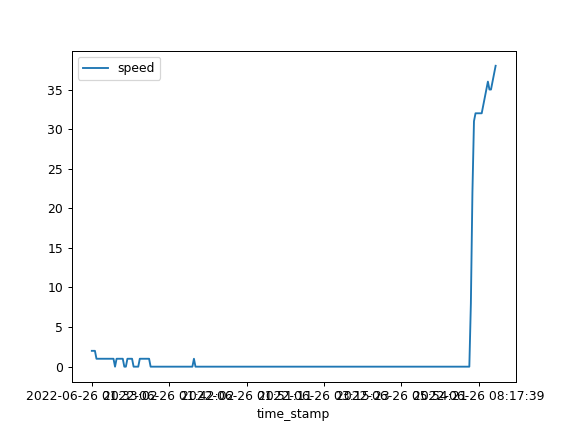

56708:57073 SPEED


<IPython.core.display.Javascript object>


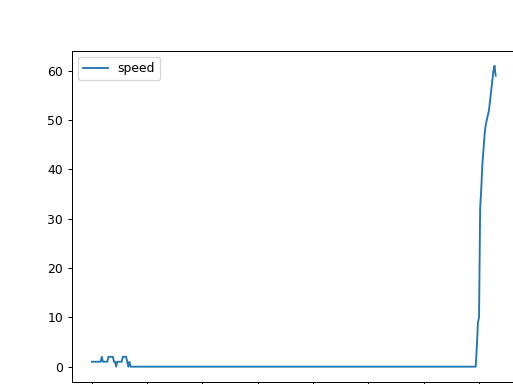

In [26]:
dft=dfA1b1.loc[(dfA1b1['entsort']=='ent')|(dfA1b1['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        df.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

289:478 SPEED


<IPython.core.display.Javascript object>


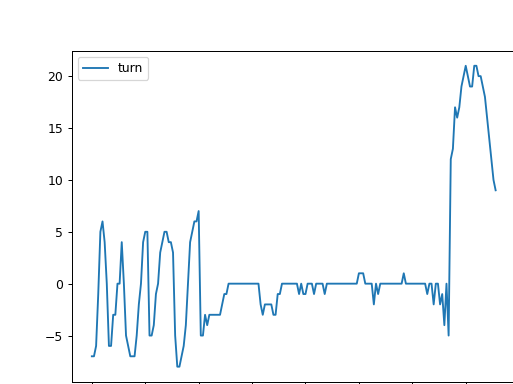

6078:6538 SPEED


<IPython.core.display.Javascript object>


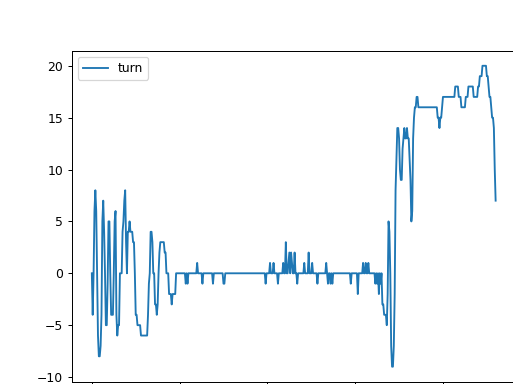

11994:12193 SPEED


<IPython.core.display.Javascript object>


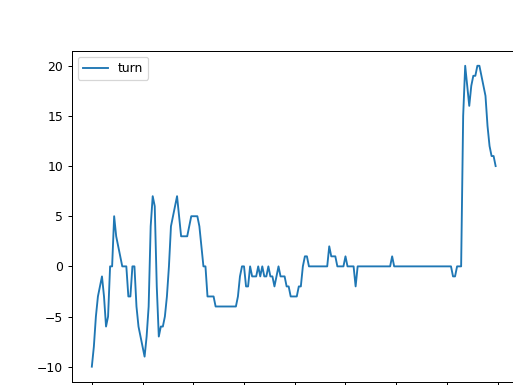

15592:15875 SPEED


<IPython.core.display.Javascript object>


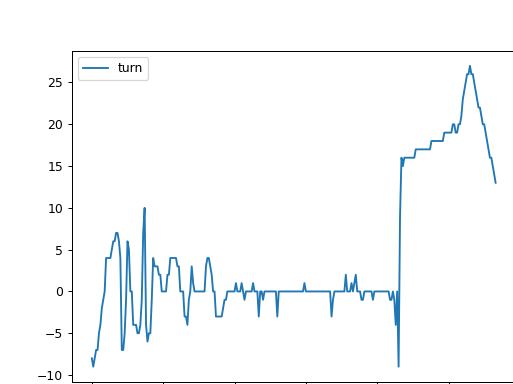

31014:31268 SPEED


<IPython.core.display.Javascript object>


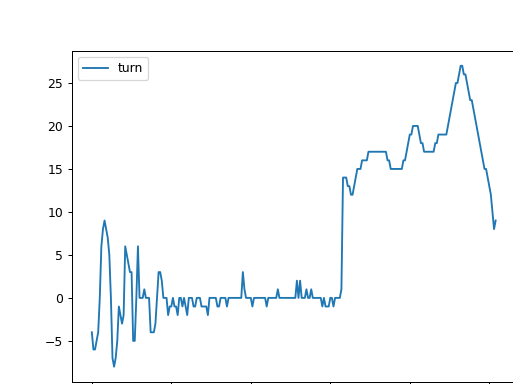

33229:33522 SPEED


<IPython.core.display.Javascript object>


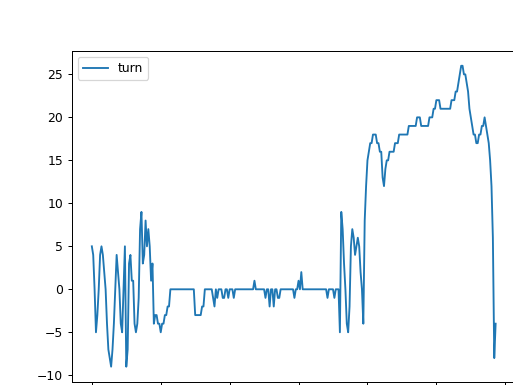

38562:38832 SPEED


<IPython.core.display.Javascript object>


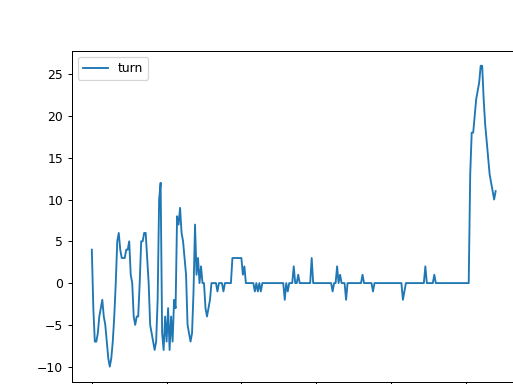

41211:41431 SPEED


<IPython.core.display.Javascript object>


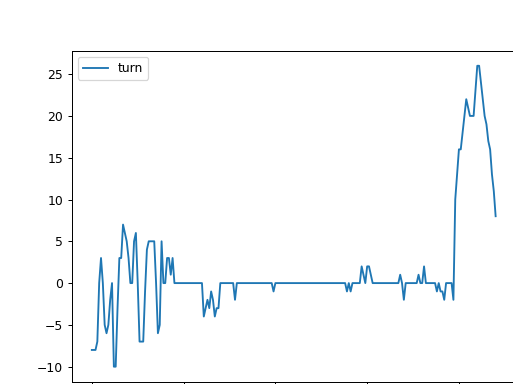

46755:46996 SPEED


<IPython.core.display.Javascript object>


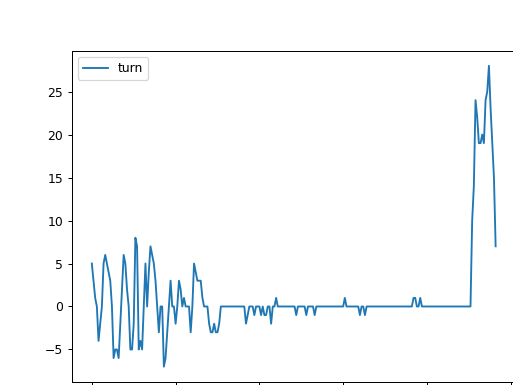

50238:50499 SPEED


<IPython.core.display.Javascript object>


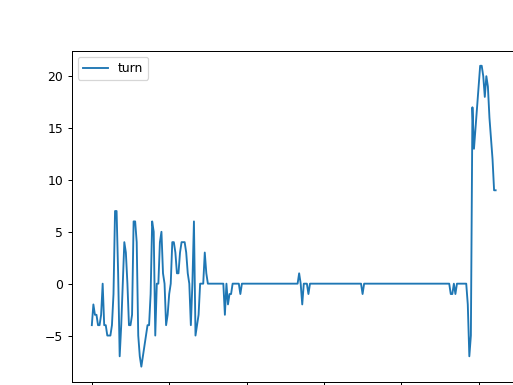

56708:57073 SPEED


<IPython.core.display.Javascript object>


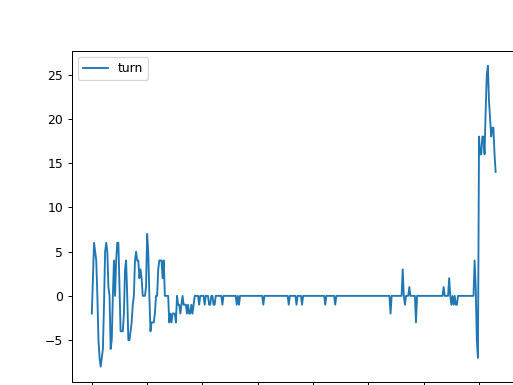

In [27]:
dft=dfA1b1.loc[(dfA1b1['entsort']=='ent')|(dfA1b1['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        df.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

## 247383600

In [25]:
dfA1b2=dfAmmsi.get_group(247383600).copy()

683:2614 SPEED


<IPython.core.display.Javascript object>


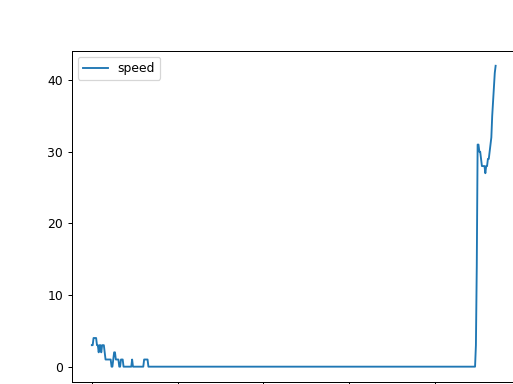

9728:9921 SPEED


<IPython.core.display.Javascript object>


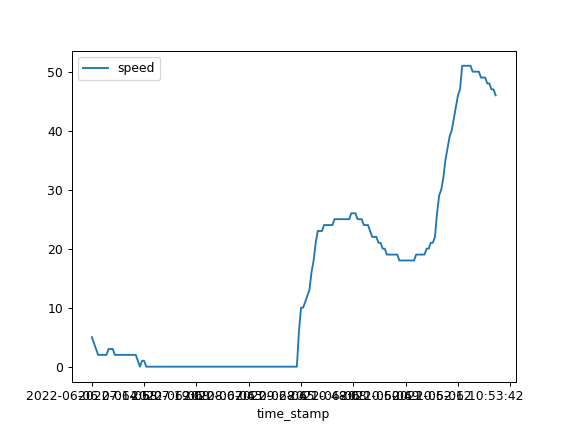

12398:14331 SPEED


<IPython.core.display.Javascript object>


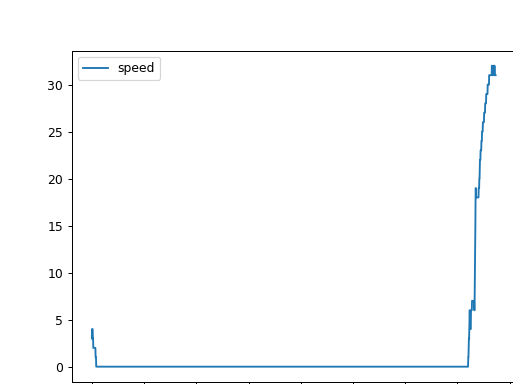

20292:20547 SPEED


<IPython.core.display.Javascript object>


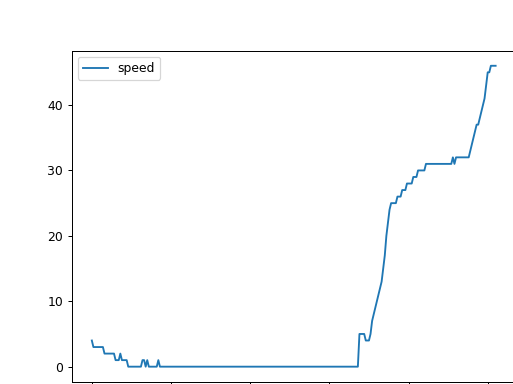

31796:32001 SPEED


<IPython.core.display.Javascript object>


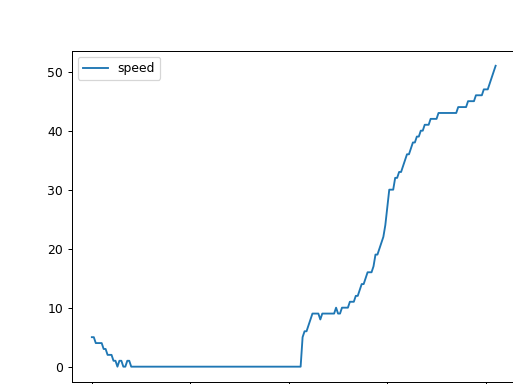

37342:37634 SPEED


<IPython.core.display.Javascript object>


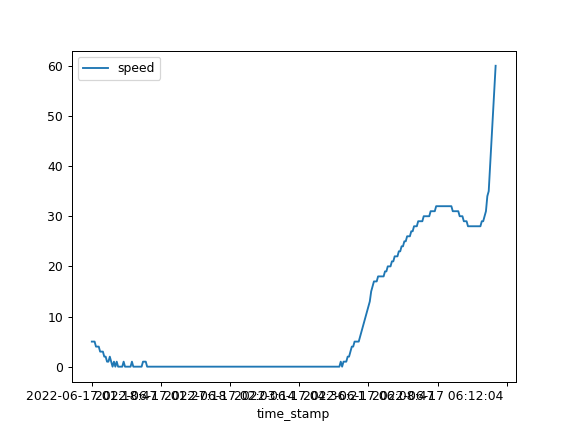

39397:39557 SPEED


<IPython.core.display.Javascript object>


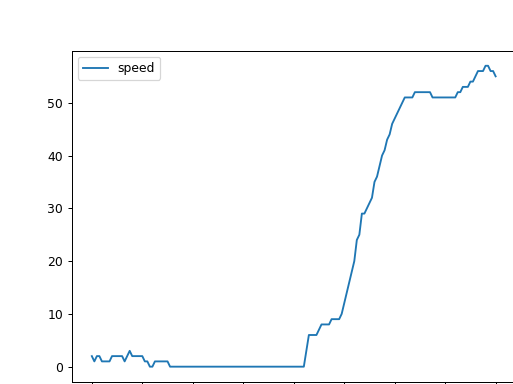

44526:44764 SPEED


<IPython.core.display.Javascript object>


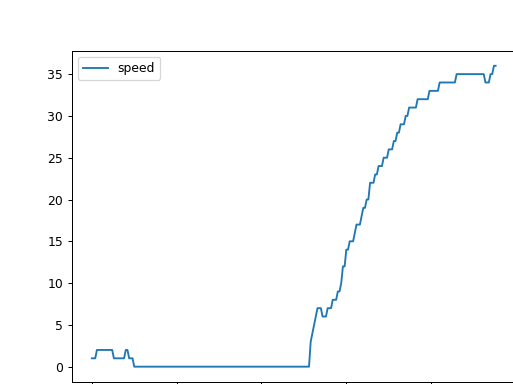

47191:47436 SPEED


<IPython.core.display.Javascript object>


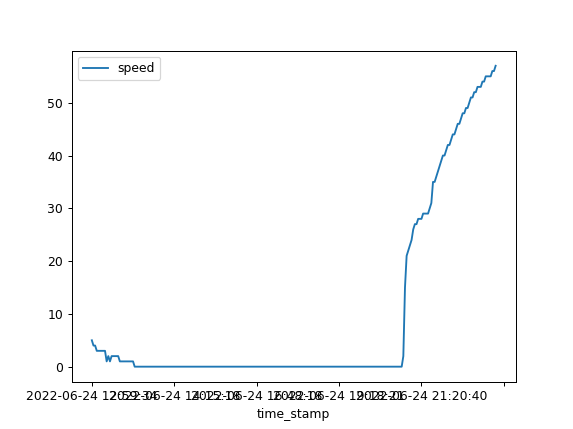

In [26]:
dft=dfA1b2.loc[(dfA1b2['entsort']=='ent')|(dfA1b2['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

683:2614 SPEED


<IPython.core.display.Javascript object>


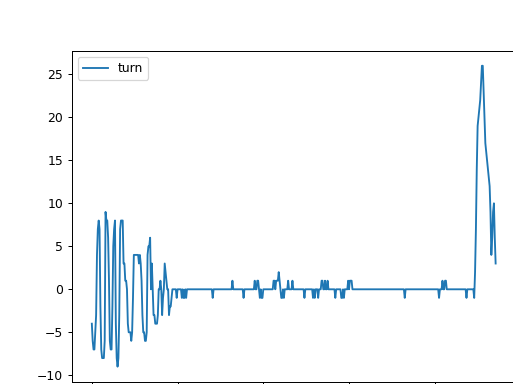

9728:9921 SPEED


<IPython.core.display.Javascript object>


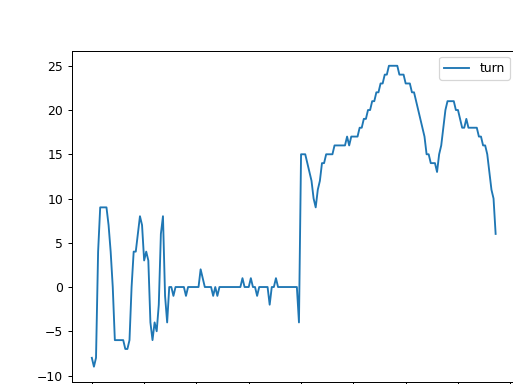

12398:14331 SPEED


<IPython.core.display.Javascript object>


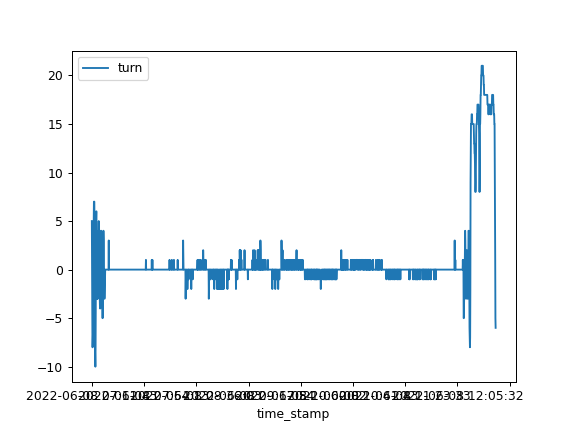

20292:20547 SPEED


<IPython.core.display.Javascript object>


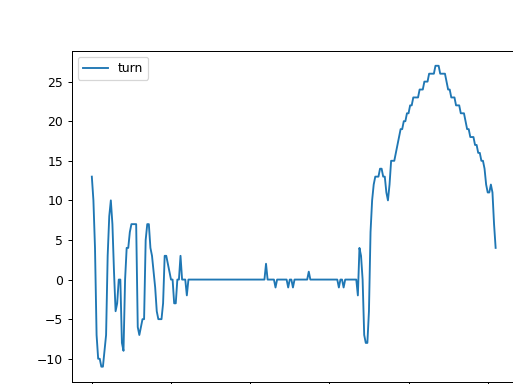

31796:32001 SPEED


<IPython.core.display.Javascript object>


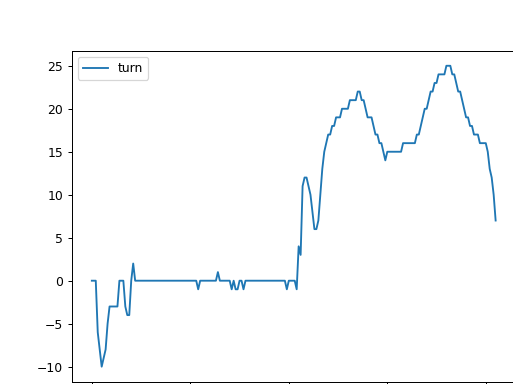

37342:37634 SPEED


<IPython.core.display.Javascript object>


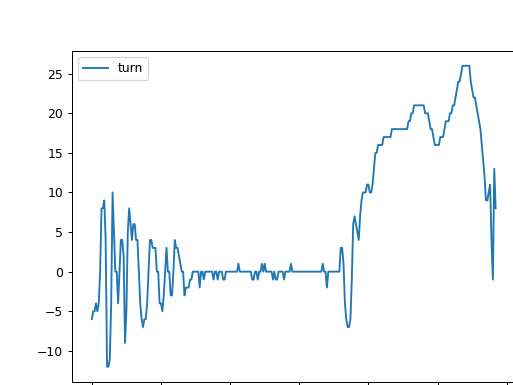

39397:39557 SPEED


<IPython.core.display.Javascript object>


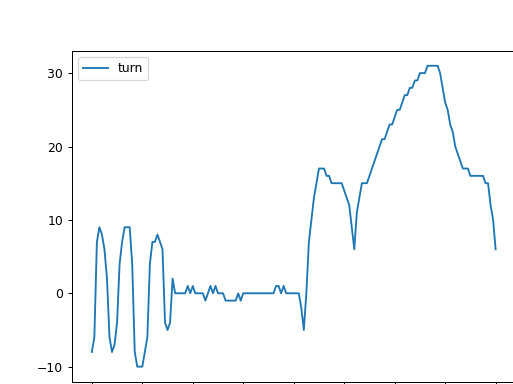

44526:44764 SPEED


<IPython.core.display.Javascript object>


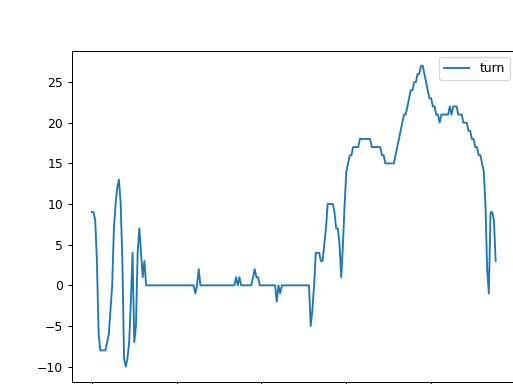

47191:47436 SPEED


<IPython.core.display.Javascript object>


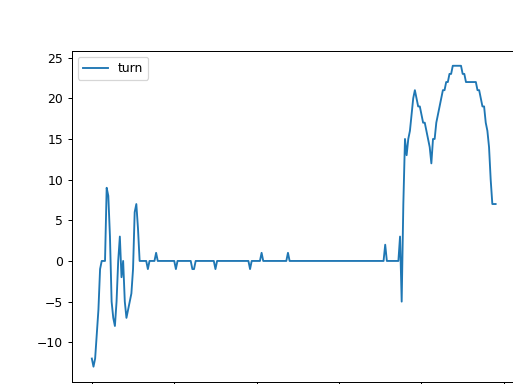

In [27]:
dft=dfA1b2.loc[(dfA1b2['entsort']=='ent')|(dfA1b2['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

## 247219400

In [21]:
dfA1b3=dfAmmsi.get_group(247219400).copy()

1213:2582 SPEED


<IPython.core.display.Javascript object>


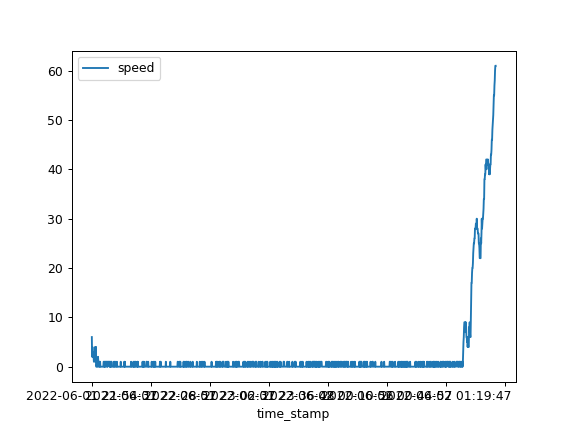

6647:7239 SPEED


<IPython.core.display.Javascript object>


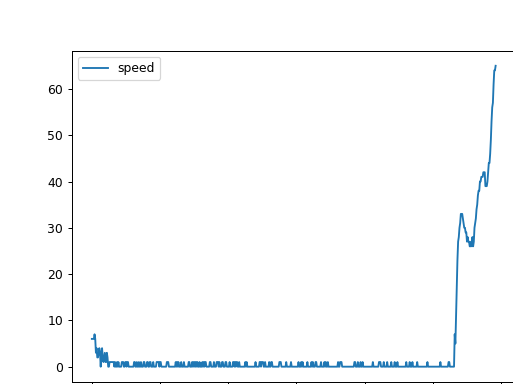

8781:9493 SPEED


<IPython.core.display.Javascript object>


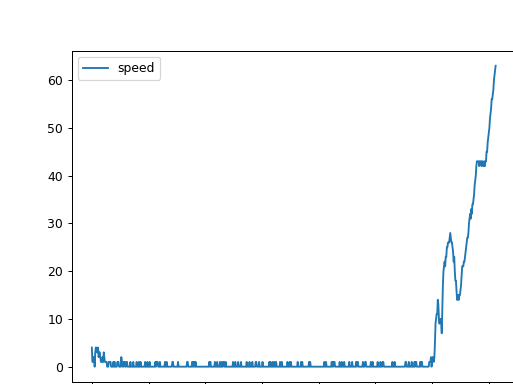

14434:14669 SPEED


<IPython.core.display.Javascript object>


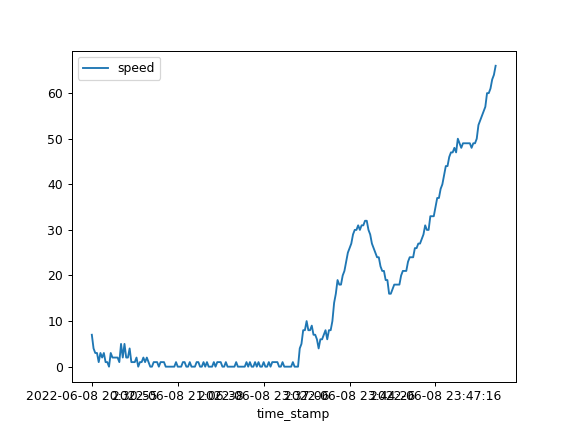

19804:20052 SPEED


<IPython.core.display.Javascript object>


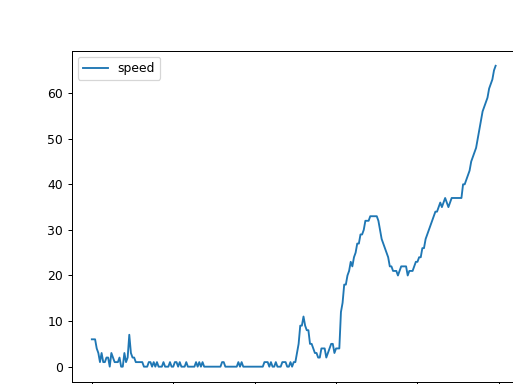

21990:30438 SPEED


<IPython.core.display.Javascript object>


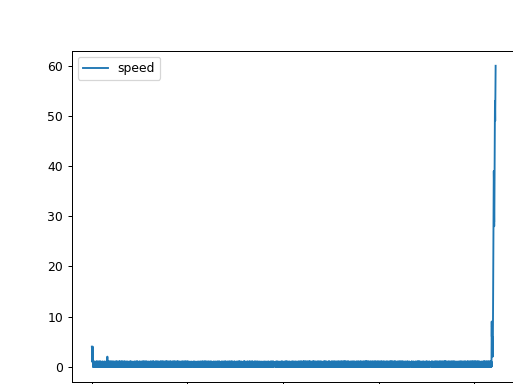

33600:33796 SPEED


<IPython.core.display.Javascript object>


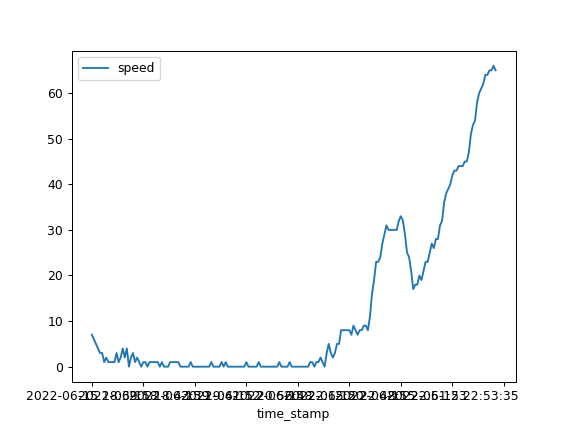

38053:38297 SPEED


<IPython.core.display.Javascript object>


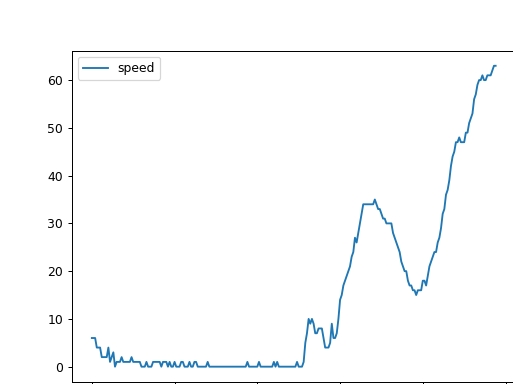

39651:40172 SPEED


<IPython.core.display.Javascript object>


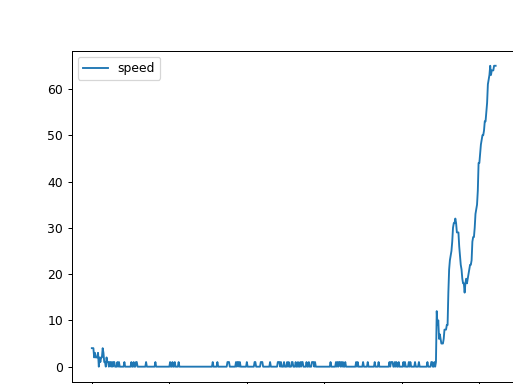

42922:44266 SPEED


<IPython.core.display.Javascript object>


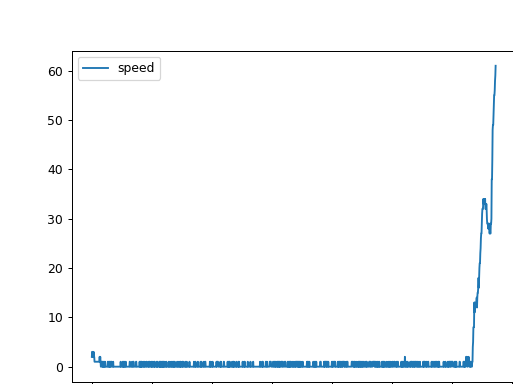

47540:47775 SPEED


<IPython.core.display.Javascript object>


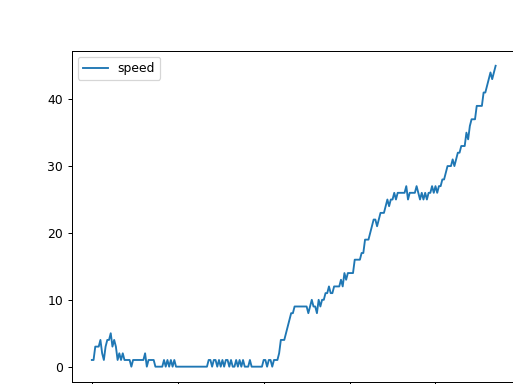

50623:51226 SPEED


<IPython.core.display.Javascript object>


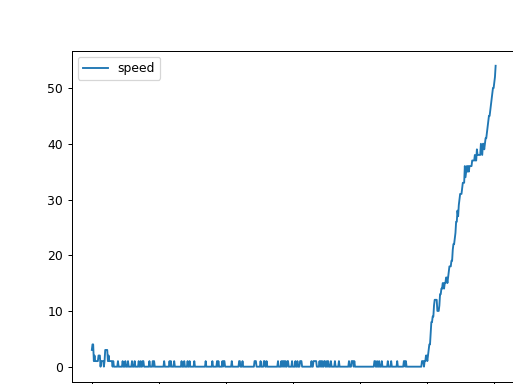

56306:56455 SPEED


<IPython.core.display.Javascript object>


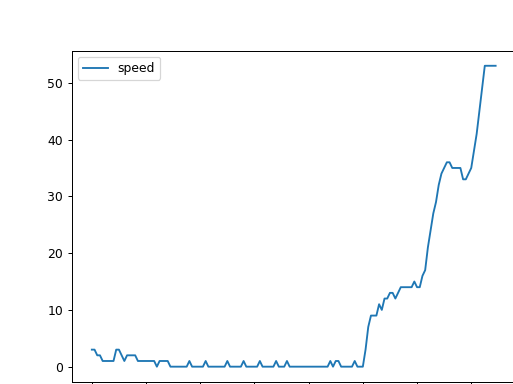

In [22]:
dft=dfA1b3.loc[(dfA1b3['entsort']=='ent')|(dfA1b3['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b3.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

1213:2582 SPEED


<IPython.core.display.Javascript object>


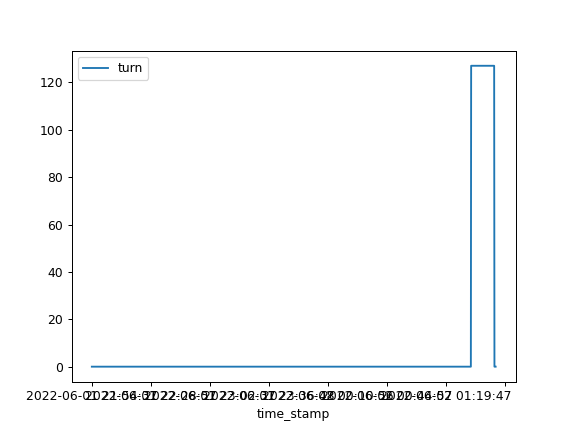

6647:7239 SPEED


<IPython.core.display.Javascript object>


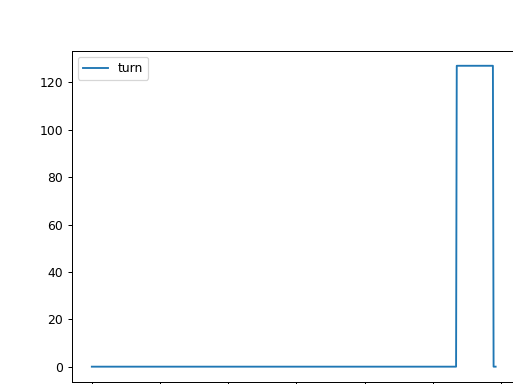

8781:9493 SPEED


<IPython.core.display.Javascript object>


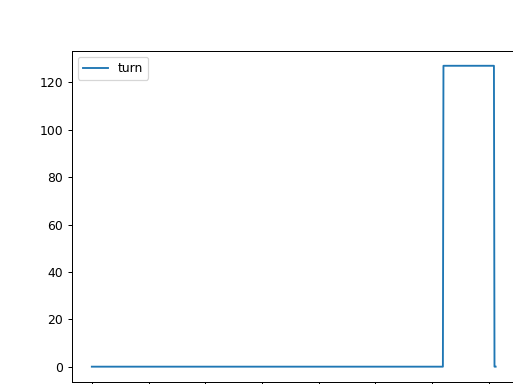

14434:14669 SPEED


<IPython.core.display.Javascript object>


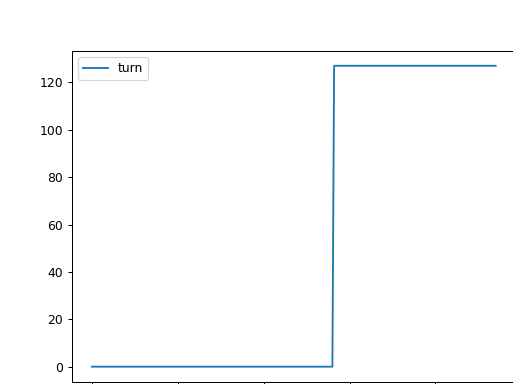

19804:20052 SPEED


<IPython.core.display.Javascript object>


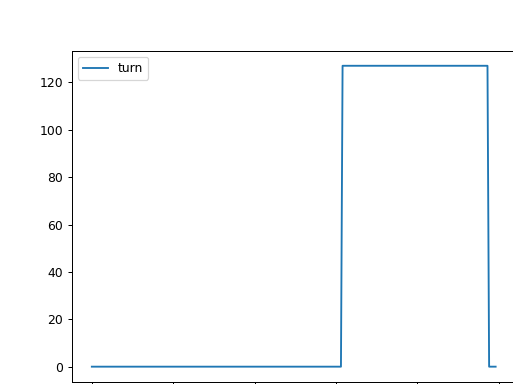

21990:30438 SPEED


<IPython.core.display.Javascript object>


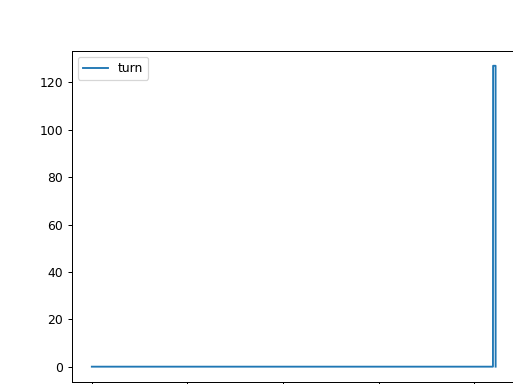

33600:33796 SPEED


<IPython.core.display.Javascript object>


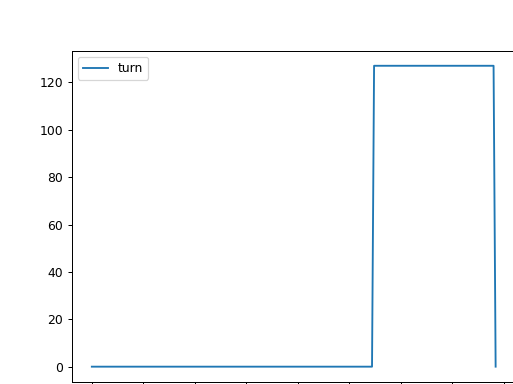

38053:38297 SPEED


<IPython.core.display.Javascript object>


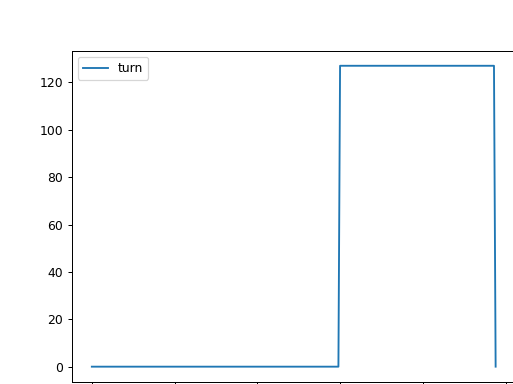

39651:40172 SPEED


<IPython.core.display.Javascript object>


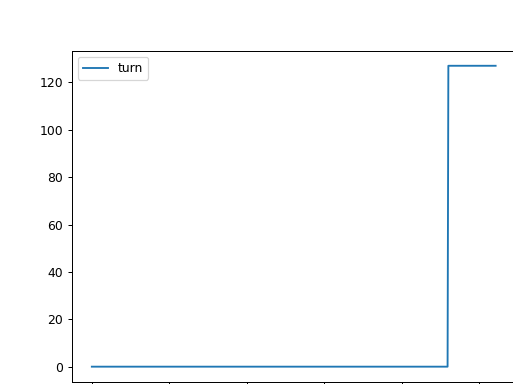

42922:44266 SPEED


<IPython.core.display.Javascript object>


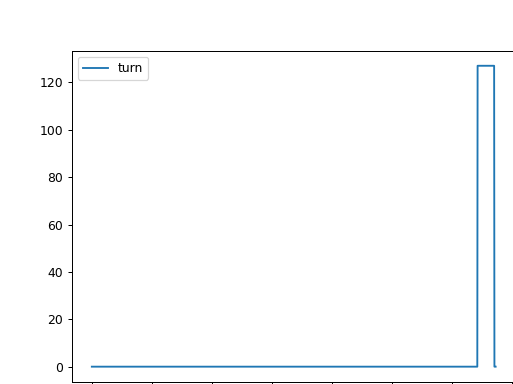

47540:47775 SPEED


<IPython.core.display.Javascript object>


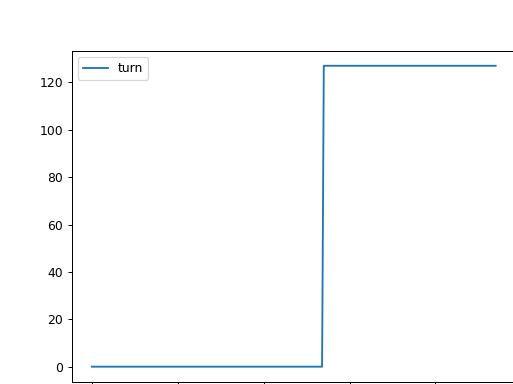

50623:51226 SPEED


<IPython.core.display.Javascript object>


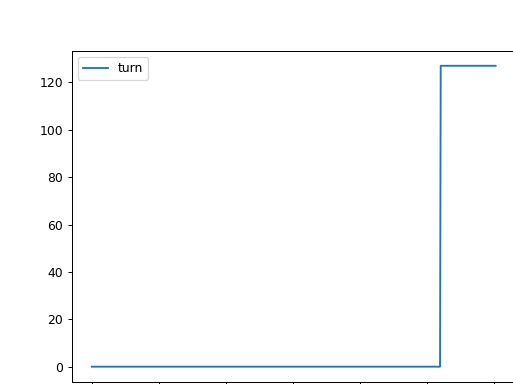

56306:56455 SPEED


<IPython.core.display.Javascript object>


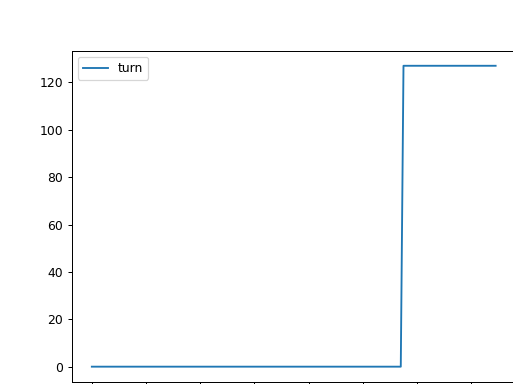

In [30]:
dft=dfA1b3.loc[(dfA1b3['entsort']=='ent')|(dfA1b3['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b3.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

## 247383400

In [24]:
dfA1b4=dfAmmsi.get_group(247383400).copy()

2898:5125 SPEED


<IPython.core.display.Javascript object>


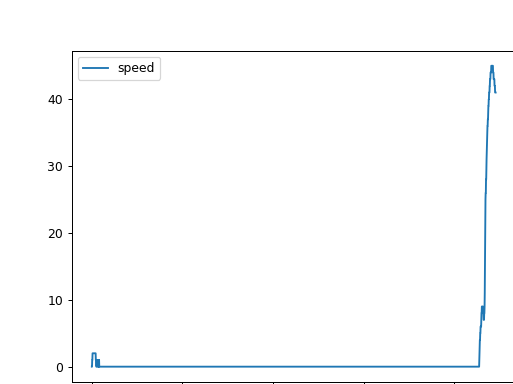

7906:8598 SPEED


<IPython.core.display.Javascript object>


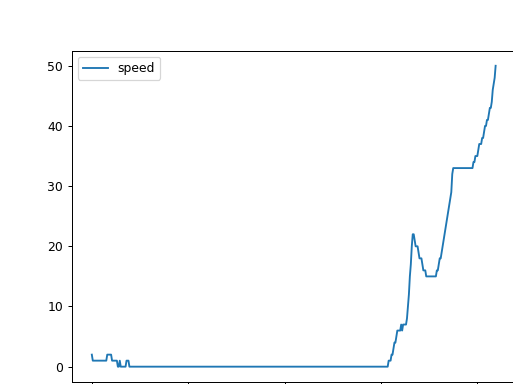

14966:15350 SPEED


<IPython.core.display.Javascript object>


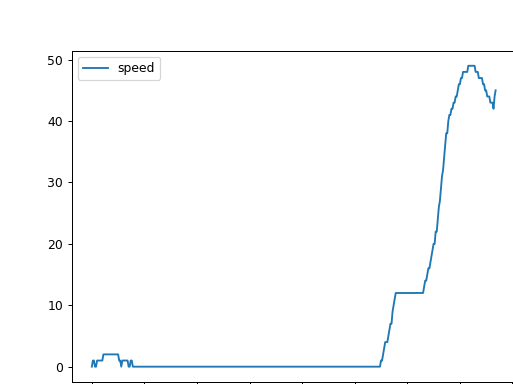

16874:19695 SPEED


<IPython.core.display.Javascript object>


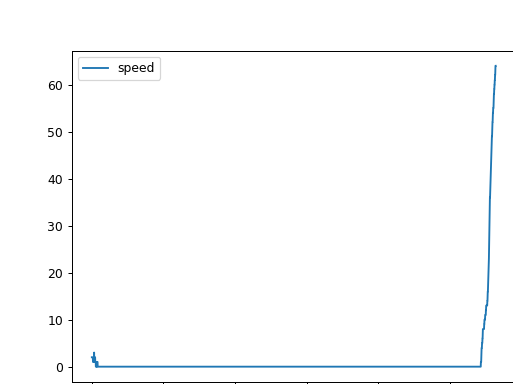

32515:32986 SPEED


<IPython.core.display.Javascript object>


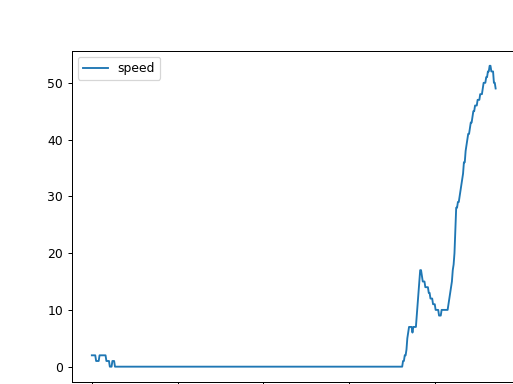

34448:36721 SPEED


<IPython.core.display.Javascript object>


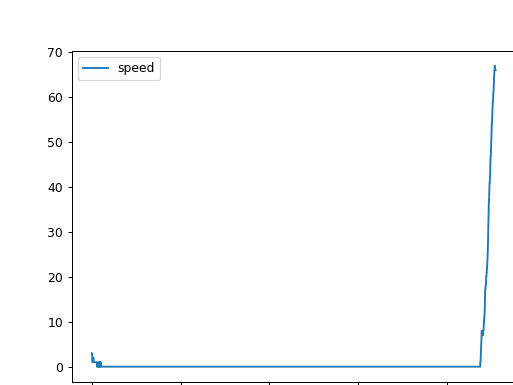

40574:40948 SPEED


<IPython.core.display.Javascript object>


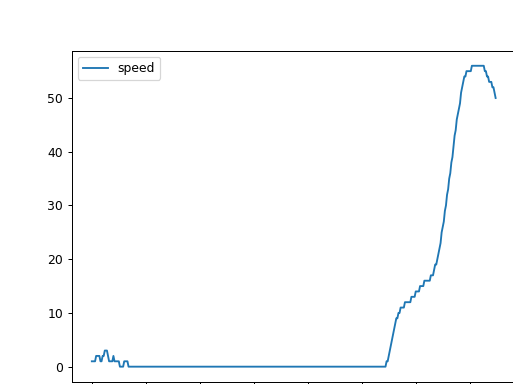

42405:42803 SPEED


<IPython.core.display.Javascript object>


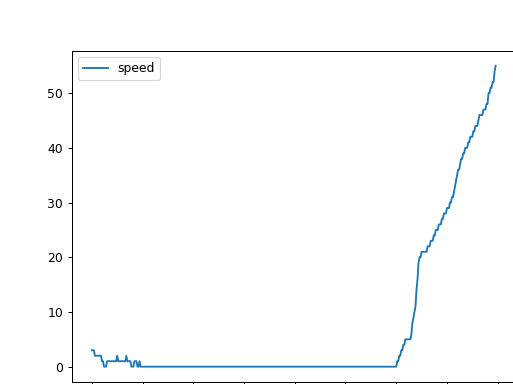

48046:48236 SPEED


<IPython.core.display.Javascript object>


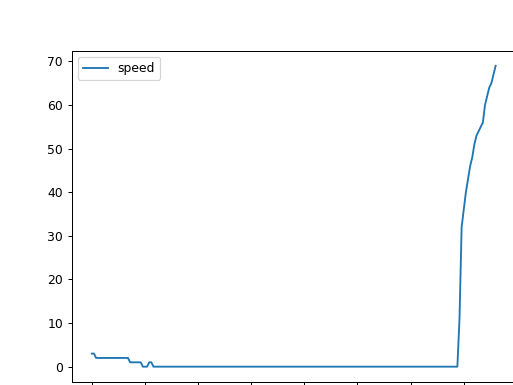

52004:52714 SPEED


<IPython.core.display.Javascript object>


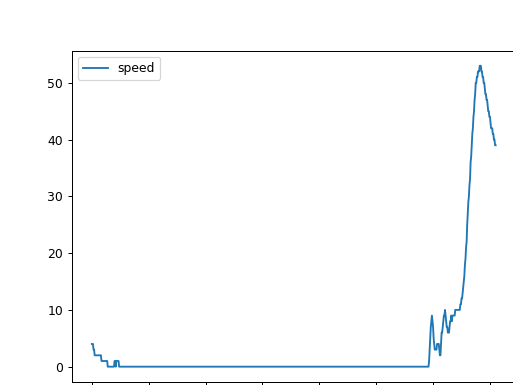

In [25]:
dft=dfA1b4.loc[(dfA1b4['entsort']=='ent')|(dfA1b4['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b4.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

2898:5125 SPEED


<IPython.core.display.Javascript object>


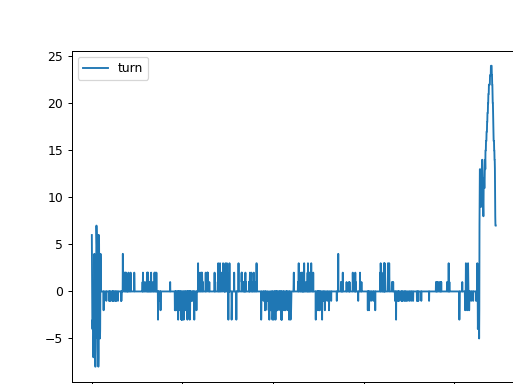

7906:8598 SPEED


<IPython.core.display.Javascript object>


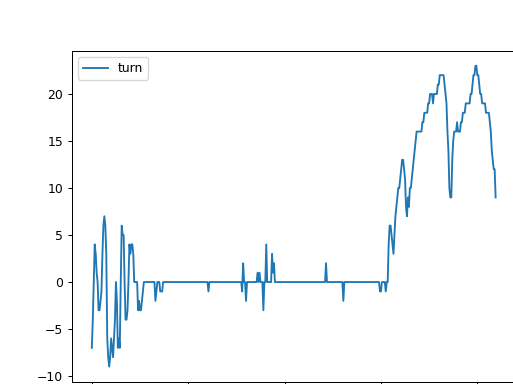

14966:15350 SPEED


<IPython.core.display.Javascript object>


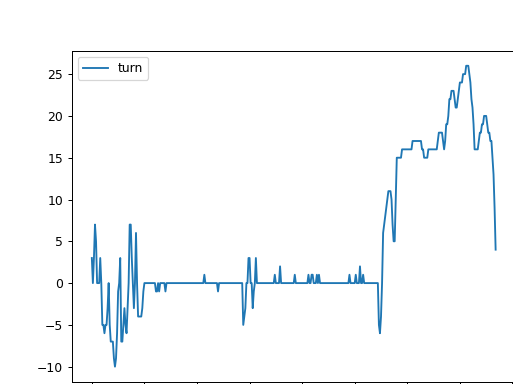

16874:19695 SPEED


<IPython.core.display.Javascript object>


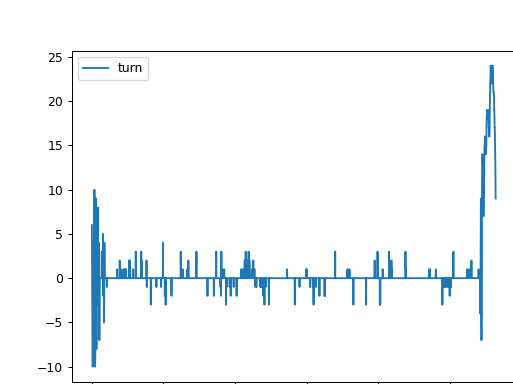

32515:32986 SPEED


<IPython.core.display.Javascript object>


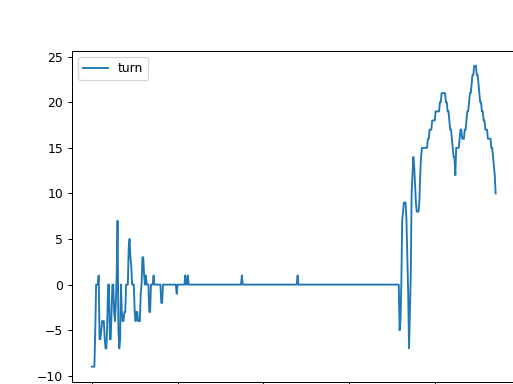

34448:36721 SPEED


<IPython.core.display.Javascript object>


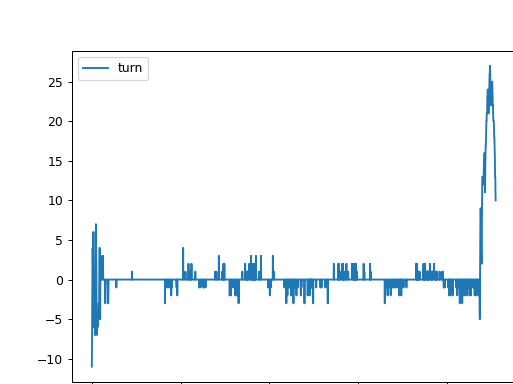

40574:40948 SPEED


<IPython.core.display.Javascript object>


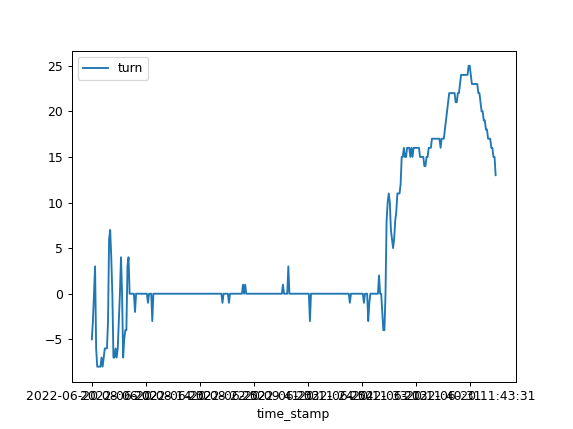

42405:42803 SPEED


<IPython.core.display.Javascript object>


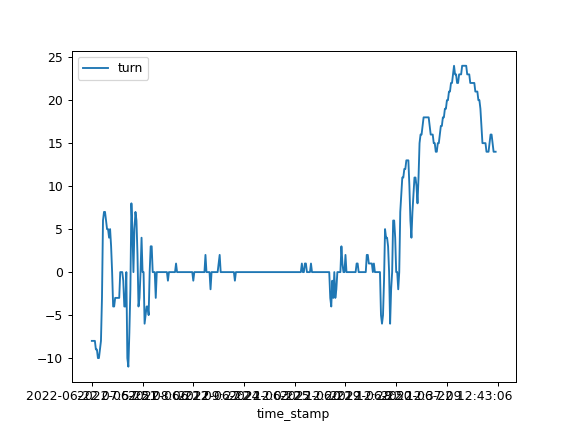

48046:48236 SPEED


<IPython.core.display.Javascript object>


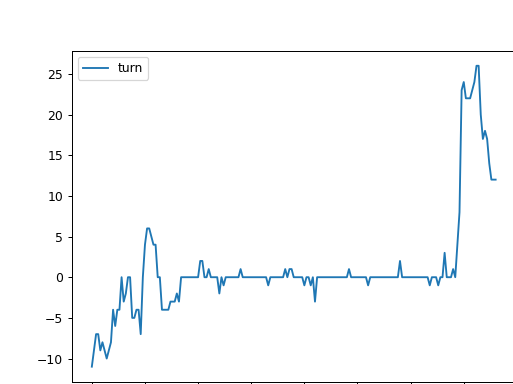

52004:52714 SPEED


<IPython.core.display.Javascript object>


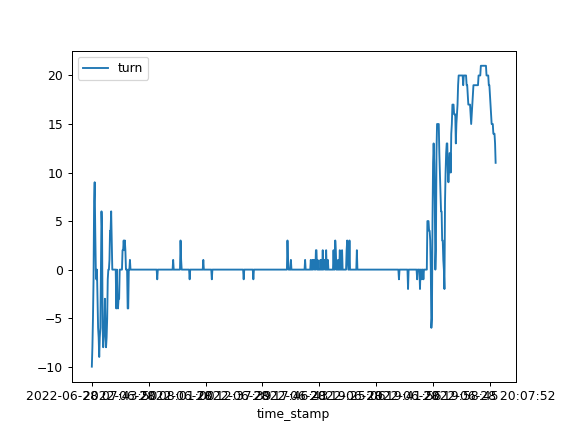

In [33]:
dft=dfA1b4.loc[(dfA1b4['entsort']=='ent')|(dfA1b4['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b4.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

## 247243600

In [26]:
dfA1b5=dfAmmsi.get_group(247243600).copy()

5249:5759 SPEED


<IPython.core.display.Javascript object>


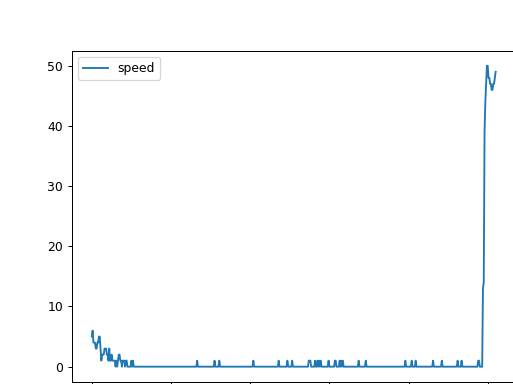

8169:8658 SPEED


<IPython.core.display.Javascript object>


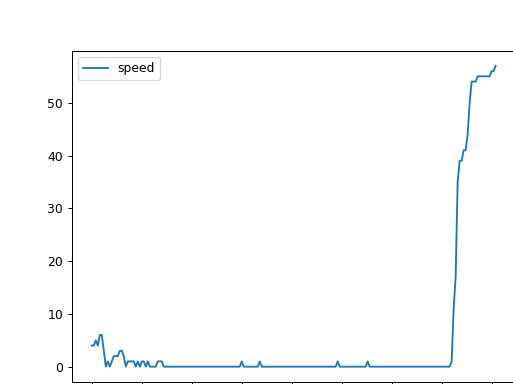

11529:11709 SPEED


<IPython.core.display.Javascript object>


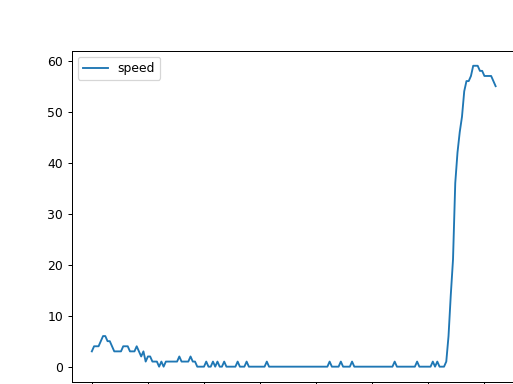

15985:16184 SPEED


<IPython.core.display.Javascript object>


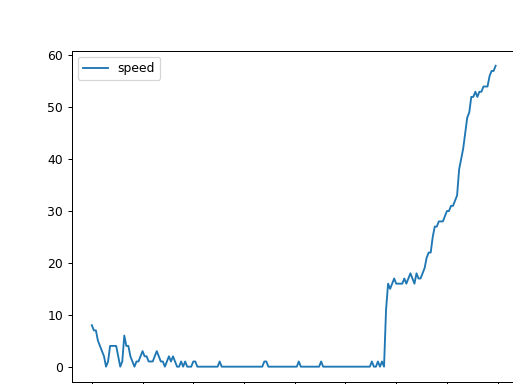

20990:21807 SPEED


<IPython.core.display.Javascript object>


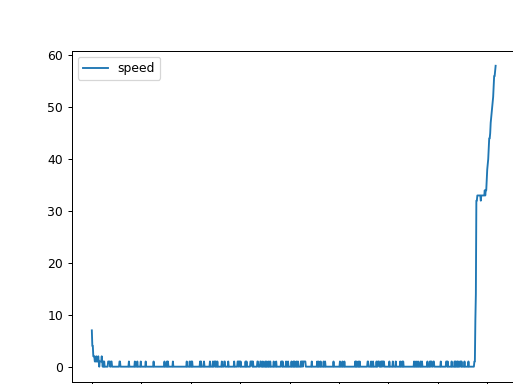

32112:32266 SPEED


<IPython.core.display.Javascript object>


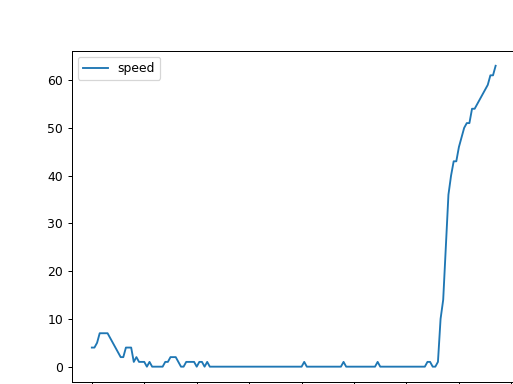

36838:37145 SPEED


<IPython.core.display.Javascript object>


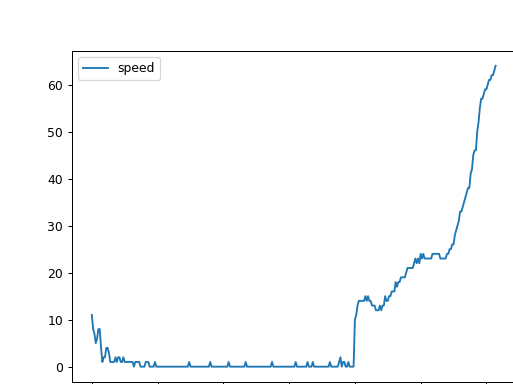

38932:39134 SPEED


<IPython.core.display.Javascript object>


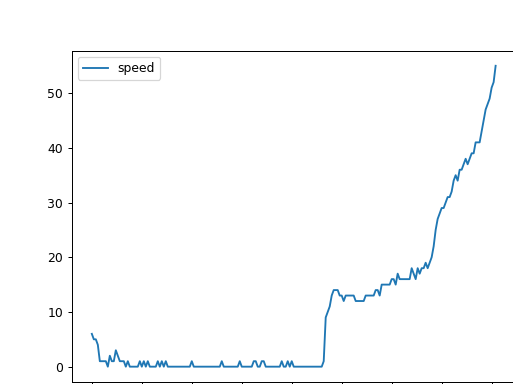

41561:41704 SPEED


<IPython.core.display.Javascript object>


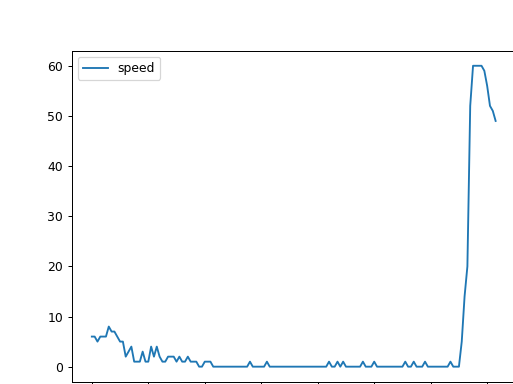

45266:46586 SPEED


<IPython.core.display.Javascript object>


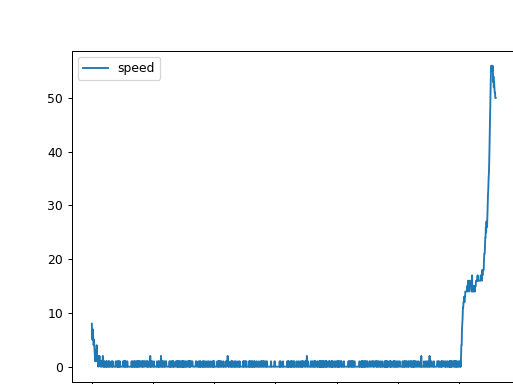

48335:49962 SPEED


<IPython.core.display.Javascript object>


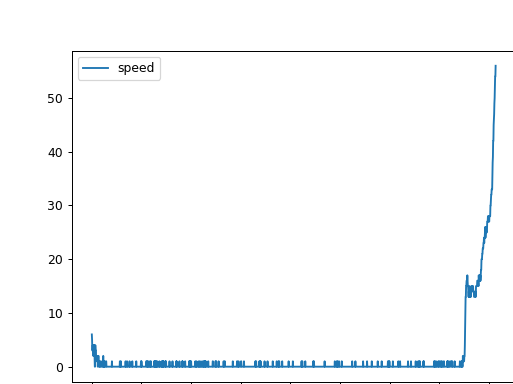

52828:52970 SPEED


<IPython.core.display.Javascript object>


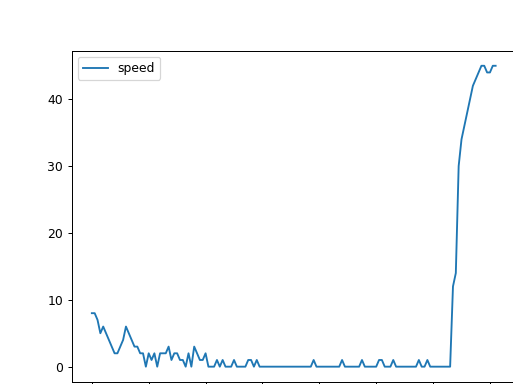

57168:57320 SPEED


<IPython.core.display.Javascript object>


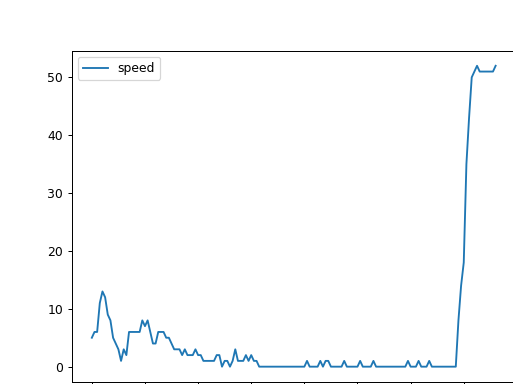

In [27]:
dft=dfA1b5.loc[(dfA1b5['entsort']=='ent')|(dfA1b5['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b5.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

5249:5759 SPEED


<IPython.core.display.Javascript object>


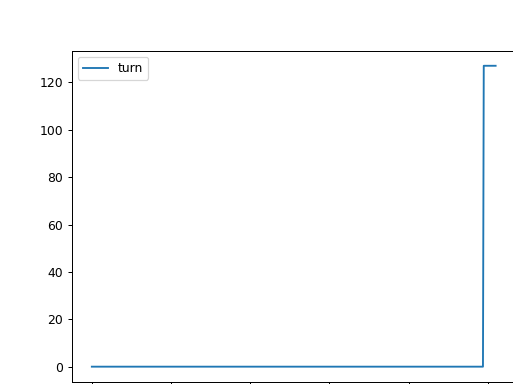

8169:8658 SPEED


<IPython.core.display.Javascript object>


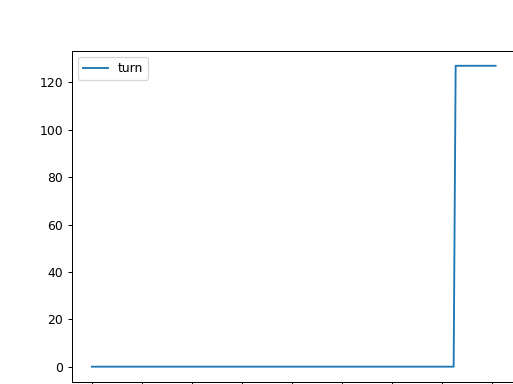

11529:11709 SPEED


<IPython.core.display.Javascript object>


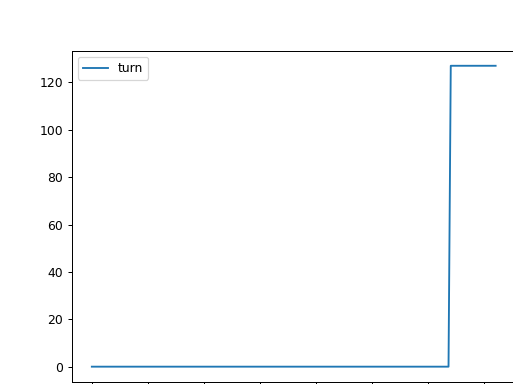

15985:16184 SPEED


<IPython.core.display.Javascript object>


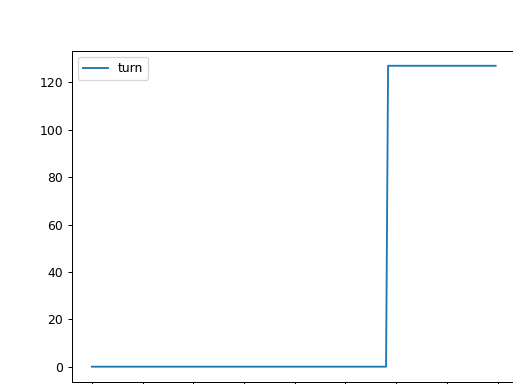

20990:21807 SPEED


<IPython.core.display.Javascript object>


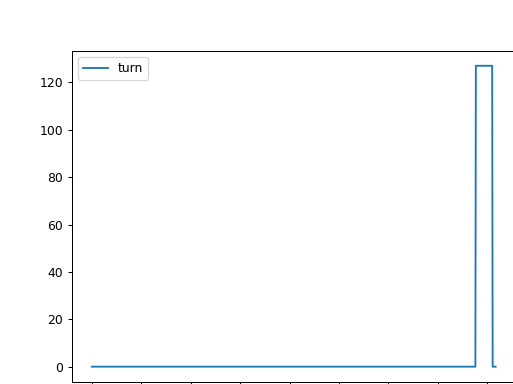

32112:32266 SPEED


<IPython.core.display.Javascript object>


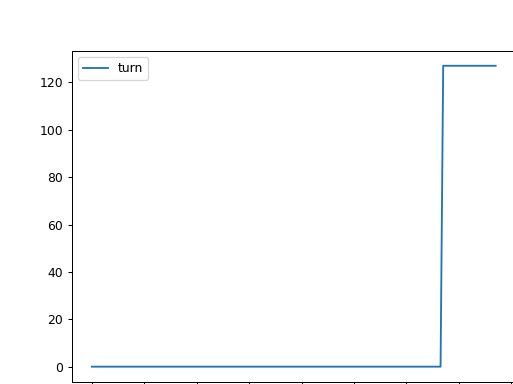

36838:37145 SPEED


<IPython.core.display.Javascript object>


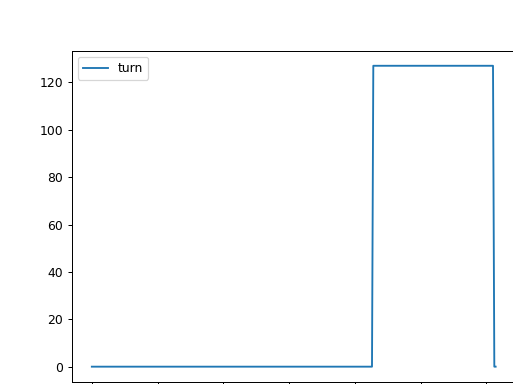

38932:39134 SPEED


<IPython.core.display.Javascript object>


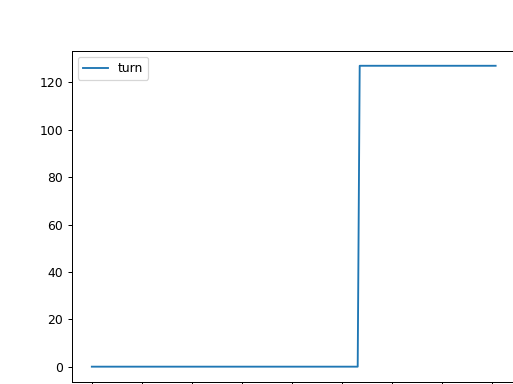

41561:41704 SPEED


<IPython.core.display.Javascript object>


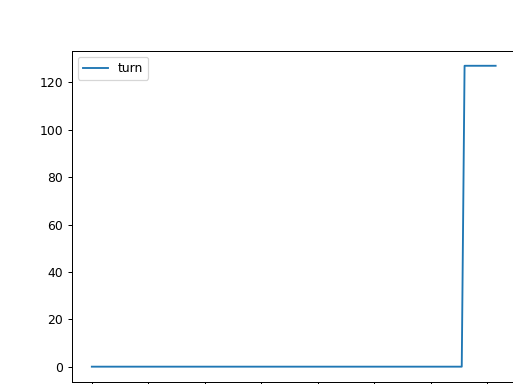

45266:46586 SPEED


<IPython.core.display.Javascript object>


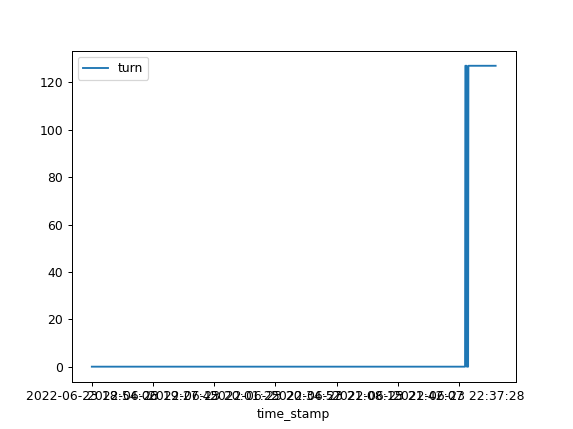

48335:49962 SPEED


<IPython.core.display.Javascript object>


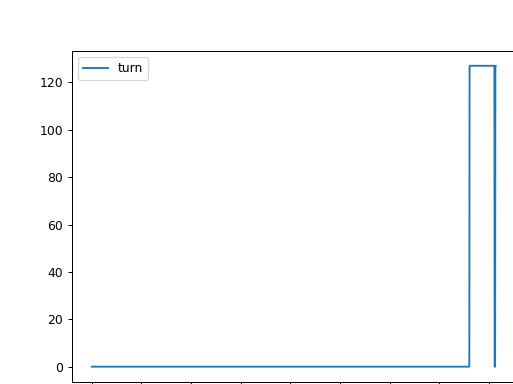

52828:52970 SPEED


<IPython.core.display.Javascript object>


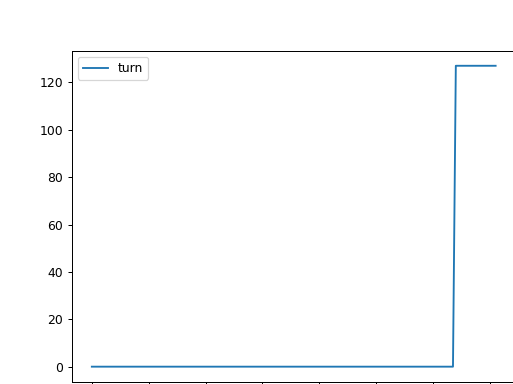

57168:57320 SPEED


<IPython.core.display.Javascript object>


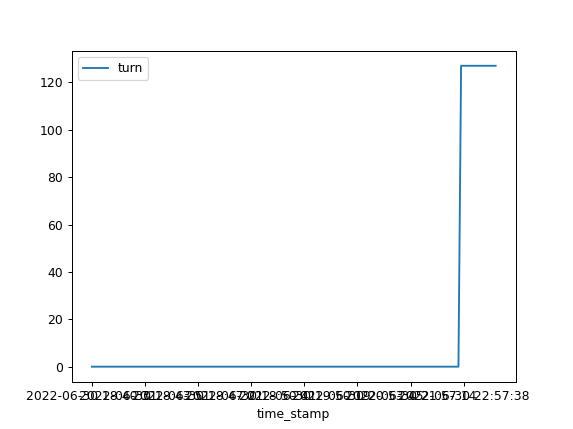

In [28]:
dft=dfA1b5.loc[(dfA1b5['entsort']=='ent')|(dfA1b5['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b5.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

## 247383300 

In [29]:
dfA1b6=dfAmmsi.get_group(247383300).copy()

7450:7633 SPEED


<IPython.core.display.Javascript object>


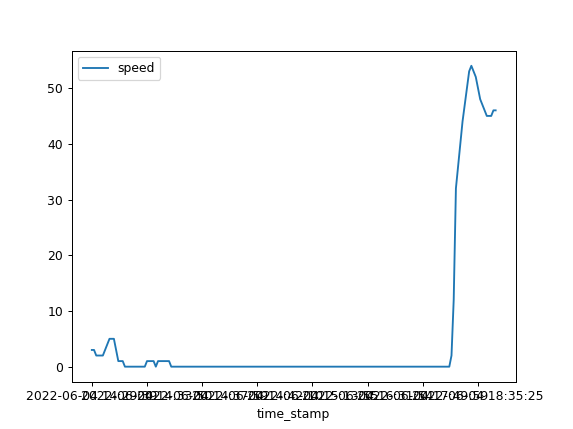

11174:11415 SPEED


<IPython.core.display.Javascript object>


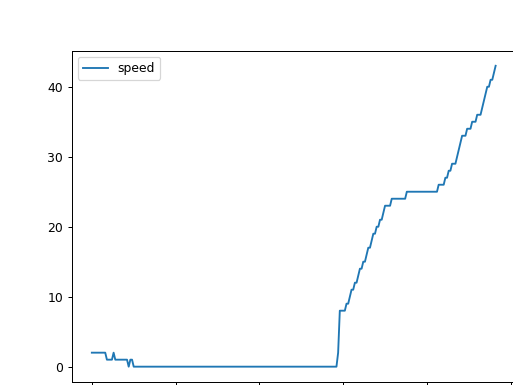

16391:16667 SPEED


<IPython.core.display.Javascript object>


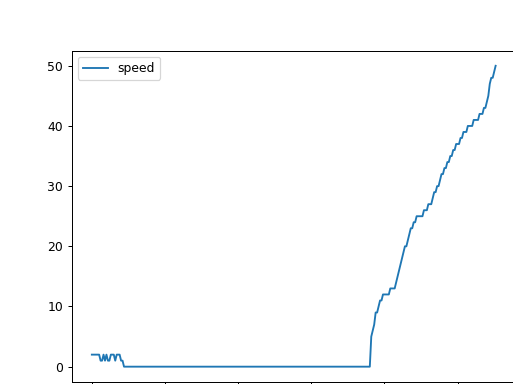

20749:21904 SPEED


<IPython.core.display.Javascript object>


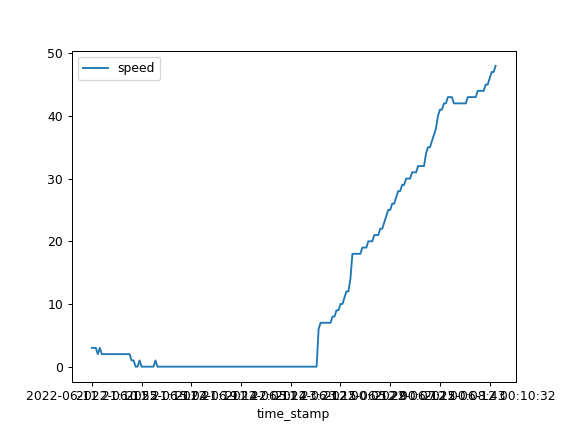

34015:34190 SPEED


<IPython.core.display.Javascript object>


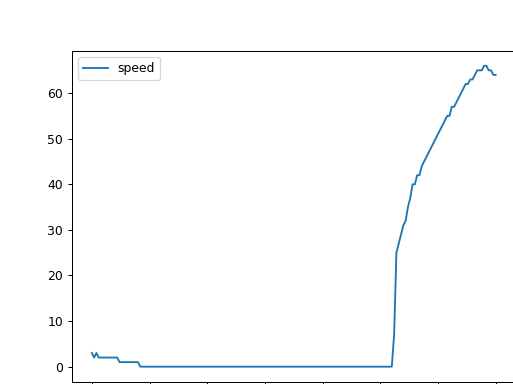

37795:37959 SPEED


<IPython.core.display.Javascript object>


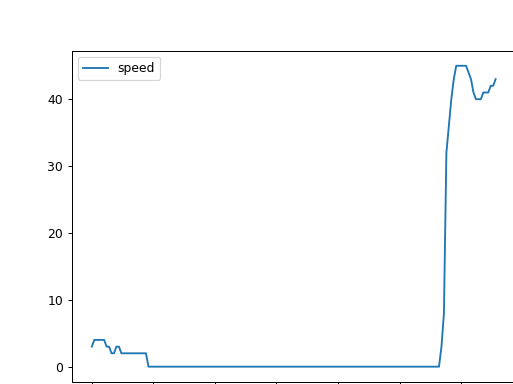

41951:42138 SPEED


<IPython.core.display.Javascript object>


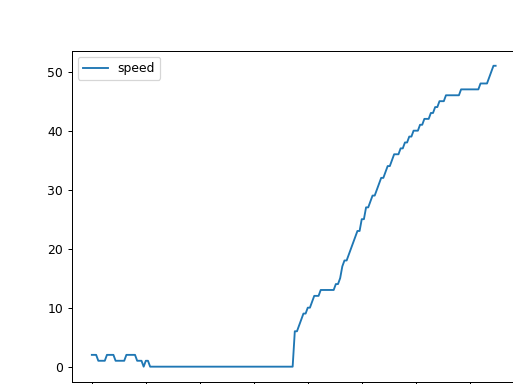

44976:45176 SPEED


<IPython.core.display.Javascript object>


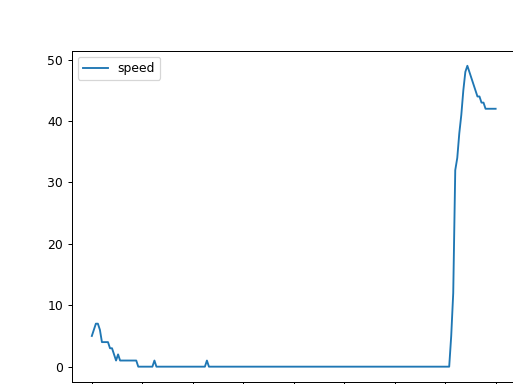

51505:51816 SPEED


<IPython.core.display.Javascript object>


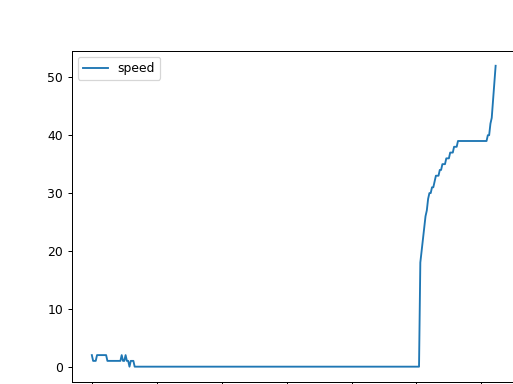

53316:56196 SPEED


<IPython.core.display.Javascript object>


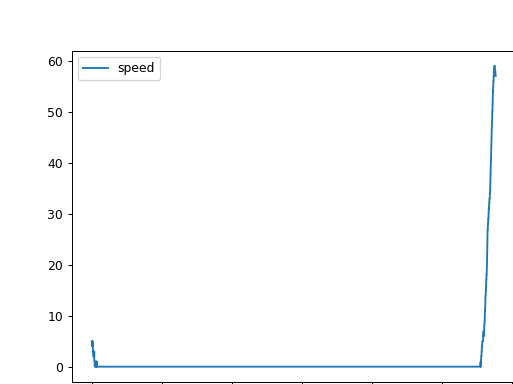

In [30]:
dft=dfA1b6.loc[(dfA1b6['entsort']=='ent')|(dfA1b6['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b6.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

7450:7633 SPEED


<IPython.core.display.Javascript object>


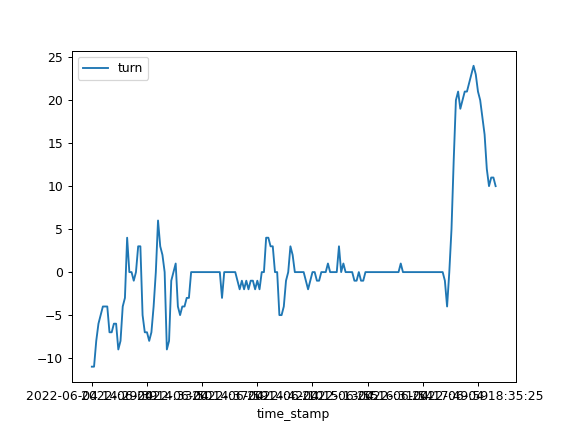

11174:11415 SPEED


<IPython.core.display.Javascript object>


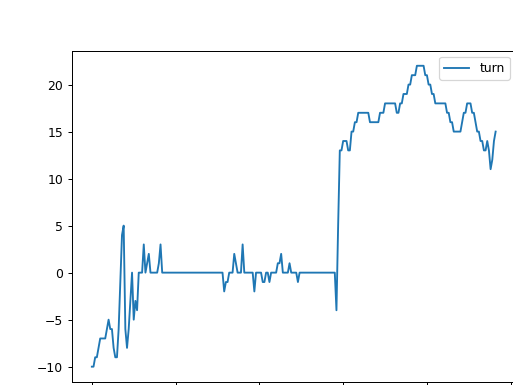

16391:16667 SPEED


<IPython.core.display.Javascript object>


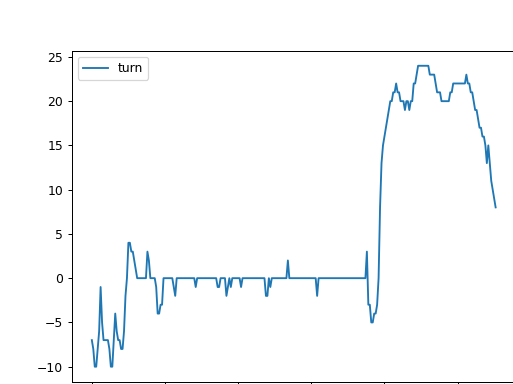

20749:21904 SPEED


<IPython.core.display.Javascript object>


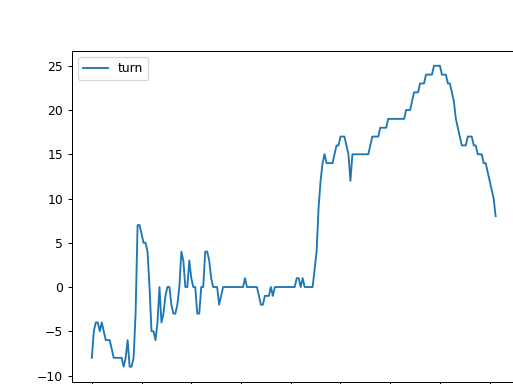

34015:34190 SPEED


<IPython.core.display.Javascript object>


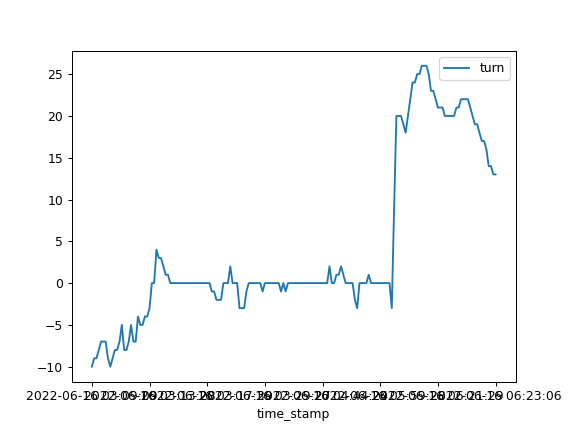

37795:37959 SPEED


<IPython.core.display.Javascript object>


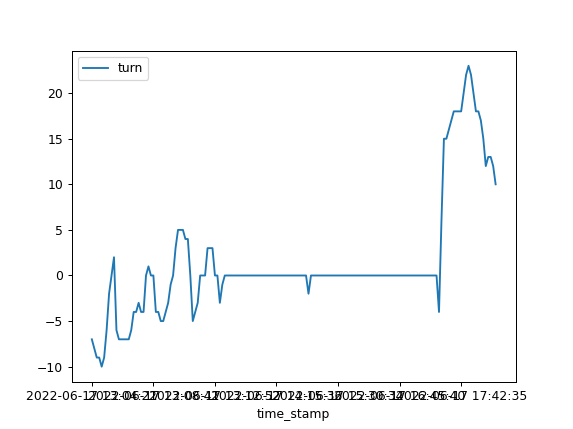

41951:42138 SPEED


<IPython.core.display.Javascript object>


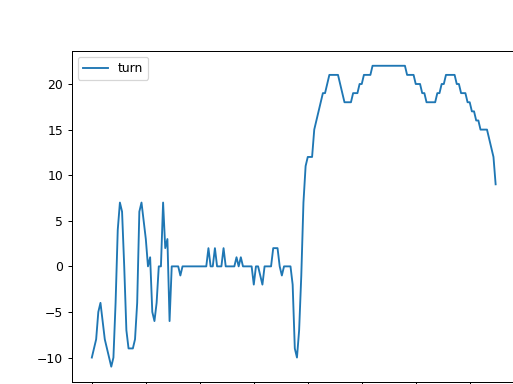

44976:45176 SPEED


<IPython.core.display.Javascript object>


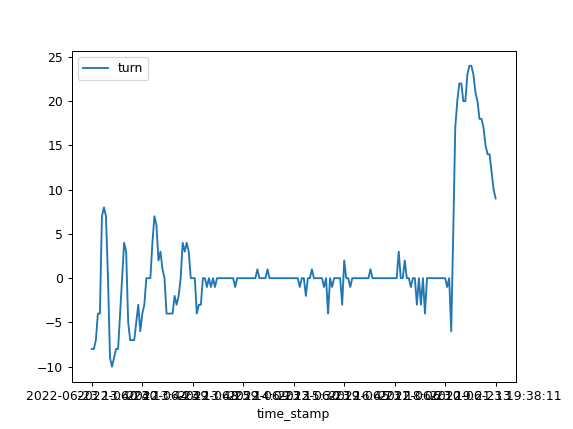

51505:51816 SPEED


<IPython.core.display.Javascript object>


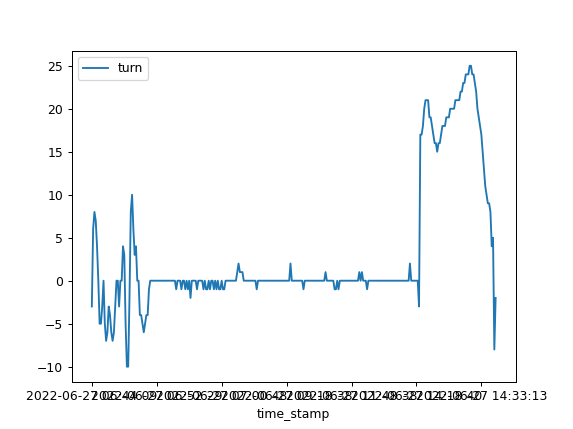

53316:56196 SPEED


<IPython.core.display.Javascript object>


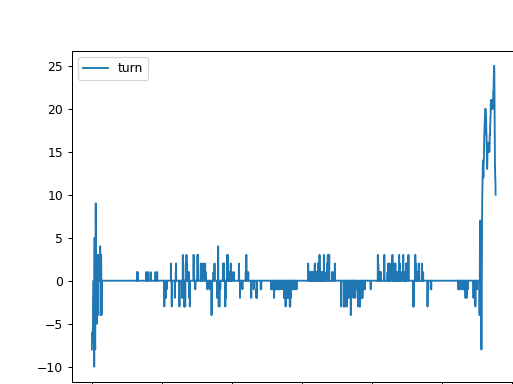

In [31]:
dft=dfA1b6.loc[(dfA1b6['entsort']=='ent')|(dfA1b6['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b6.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

## 209115000

In [32]:
dfA1b7=dfAmmsi.get_group(209115000).copy()

10057:10949 SPEED


<IPython.core.display.Javascript object>


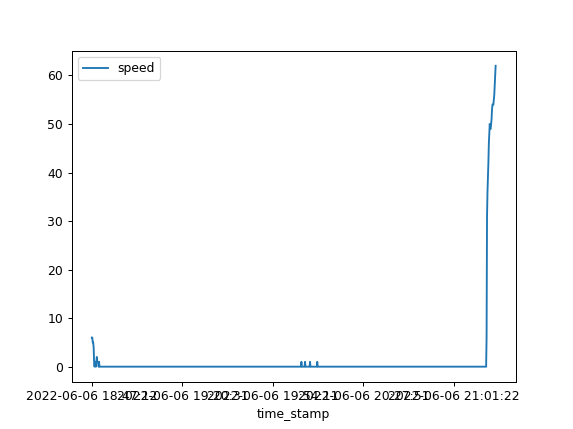

30575:30750 SPEED


<IPython.core.display.Javascript object>


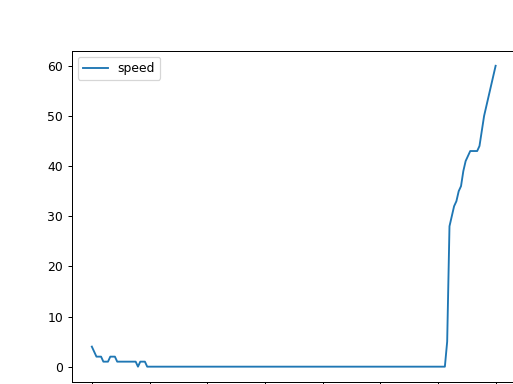

31408:31608 SPEED


<IPython.core.display.Javascript object>


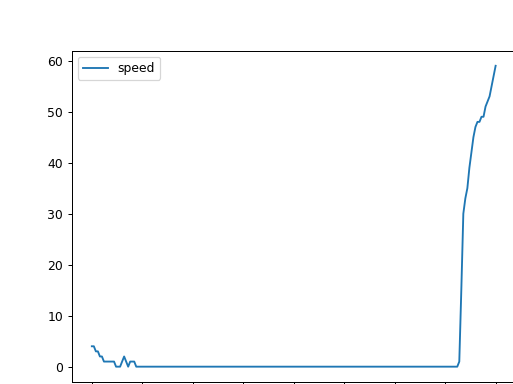

In [34]:
dft=dfA1b7.loc[(dfA1b7['entsort']=='ent')|(dfA1b7['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b7.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

10057:10949 SPEED


<IPython.core.display.Javascript object>


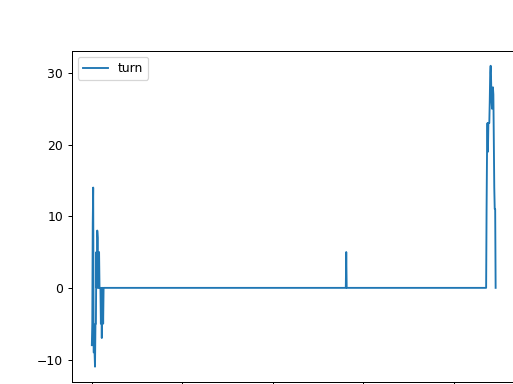

30575:30750 SPEED


<IPython.core.display.Javascript object>


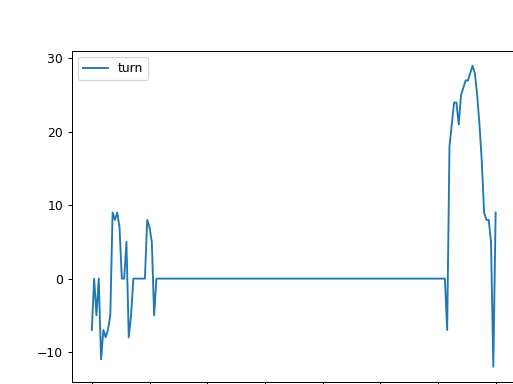

31408:31608 SPEED


<IPython.core.display.Javascript object>


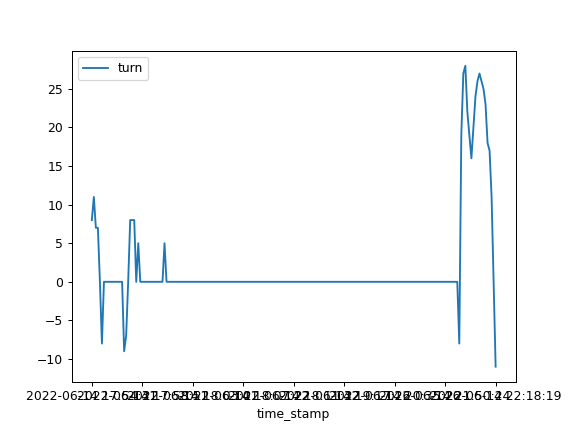

In [35]:
dft=dfA1b7.loc[(dfA1b7['entsort']=='ent')|(dfA1b7['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b7.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

## 210117000 

In [36]:
dfA1b8=dfAmmsi.get_group(210117000).copy()

40225:40288 SPEED


<IPython.core.display.Javascript object>


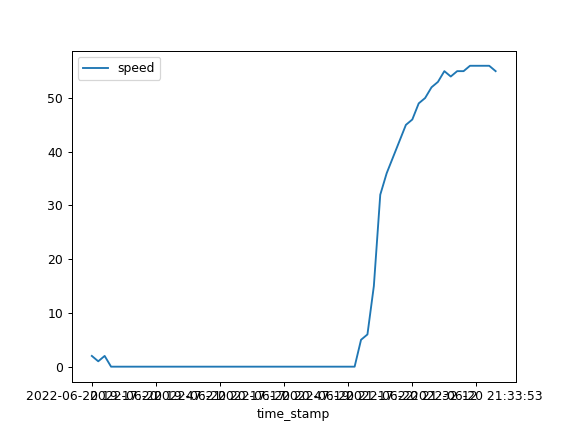

In [37]:
dft=dfA1b8.loc[(dfA1b8['entsort']=='ent')|(dfA1b8['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b8.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

40225:40288 SPEED


<IPython.core.display.Javascript object>


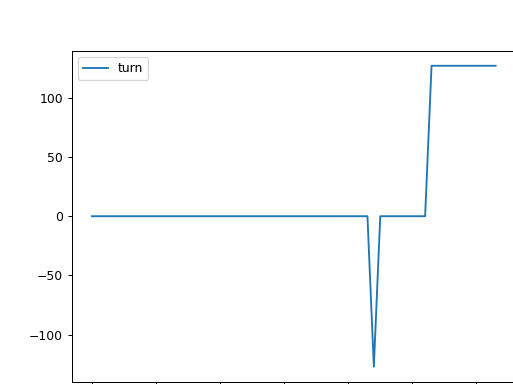

In [38]:
dft=dfA1b8.loc[(dfA1b8['entsort']=='ent')|(dfA1b8['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA1b8.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

# TEST (OPTIONAL)

In [20]:
df=dfA1b1

In [21]:
df['speed_filtered'] = df['speed'].rolling(window=3).mean()

In [22]:
df

,time_stamp,mmsi,status,turn,speed,lon,lat,course,heading,day,...,draught,to_bow,to_stern,to_starboard,to_port,imo,zone,aturat,entsort,speed_filtered
0,2022-06-01 01:03:59,247383500,0,-6.0,34.0,2.17667,41.35834,26.1,25.0,2022-06-01,...,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,NaN
1,2022-06-01 01:04:10,247383500,0,-7.0,33.0,2.17678,41.35849,25.9,25.0,2022-06-01,...,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,NaN
2,2022-06-01 01:04:20,247383500,0,-7.0,33.0,2.17686,41.35864,25.5,24.0,2022-06-01,...,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,33.333333
3,2022-06-01 01:04:30,247383500,0,-8.0,33.0,2.17695,41.35878,25.3,24.0,2022-06-01,...,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,33.000000
4,2022-06-01 01:04:40,247383500,0,-9.0,32.0,2.17704,41.35892,25.1,23.0,2022-06-01,...,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,32.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57073,2022-06-30 14:48:06,247383500,5,14.0,59.0,2.17758,41.35928,198.7,203.0,2022-06-30,...,7.0,116.0,122.0,27.0,7.0,9859557,2,NaN,sort,60.000000
57074,2022-06-30 14:48:16,247383500,5,11.0,58.0,2.17745,41.35900,200.6,204.0,2022-06-30,...,7.0,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,59.333333
57075,2022-06-30 14:48:26,247383500,5,8.0,59.0,2.17733,41.35877,202.5,204.0,2022-06-30,...,7.0,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,58.666667
57076,2022-06-30 14:48:36,247383500,5,8.0,60.0,2.17719,41.35851,202.1,205.0,2022-06-30,...,7.0,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN,59.000000


<IPython.core.display.Javascript object>


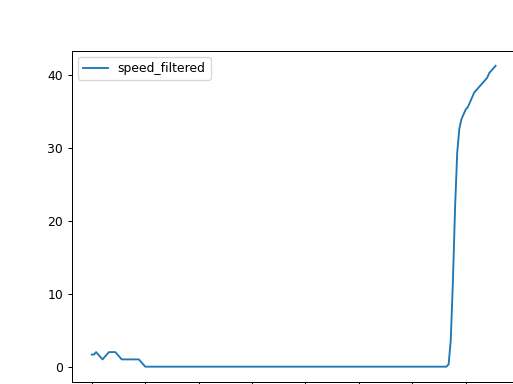

<AxesSubplot:xlabel='time_stamp'>

In [23]:
df.loc[289:478,:].plot(kind='line', x='time_stamp', y='speed_filtered')

In [22]:
sns.scatterplot(data = dfA_n2.loc[289:478,:], x = 'time_stamp',y = 'speed_filtered', s = 12, hue = 'aturat', palette = 'hsv')

ValueError: Could not interpret value `speed_filtered` for parameter `y`

# TEST (OPTIONAL)

# TEST (OPTIONAL)

In [20]:
dfA_n2['entsort'].unique()

array([nan, 'ent', 'sort'], dtype=object)

In [21]:
dfA_n2.loc[dfA_n2['aturat']==1, :]

,time_stamp,mmsi,status,turn,speed,lon,lat,course,heading,day,...,shiptype,draught,to_bow,to_stern,to_starboard,to_port,imo,zone,aturat,entsort
312,2022-06-01 01:31:39,247383500,0,0.0,0.0,2.17735,41.36474,353.6,117.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,1.0,NaN
319,2022-06-01 01:32:50,247383500,0,-1.0,0.0,2.17735,41.36474,353.6,117.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,1.0,NaN
320,2022-06-01 01:32:59,247383500,0,0.0,0.0,2.17735,41.36474,353.6,117.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,1.0,NaN
334,2022-06-01 01:35:19,247383500,0,0.0,0.0,2.17731,41.36474,353.6,116.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,1.0,NaN
351,2022-06-01 01:38:09,247383500,0,-1.0,0.0,2.17732,41.36477,353.6,116.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57301,2022-06-30 22:36:31,247243600,5,0.0,0.0,2.17507,41.36382,30.0,30.0,2022-06-30,...,60,7.2,43.0,211.0,15.0,15.0,9351488,0,1.0,NaN
57302,2022-06-30 22:39:31,247243600,5,0.0,0.0,2.17507,41.36382,30.0,30.0,2022-06-30,...,60,7.2,43.0,211.0,15.0,15.0,9351488,0,1.0,NaN
57303,2022-06-30 22:42:33,247243600,5,0.0,0.0,2.17507,41.36382,29.0,29.0,2022-06-30,...,60,7.2,43.0,211.0,15.0,15.0,9351488,0,1.0,NaN
57304,2022-06-30 22:45:35,247243600,5,0.0,0.0,2.17507,41.36382,29.0,29.0,2022-06-30,...,60,7.2,43.0,211.0,15.0,15.0,9351488,0,1.0,NaN


In [22]:
dft=dfA_n2.loc[(dfA_n2['entsort']=='ent')|(dfA_n2['entsort']=='sort') ,:].copy()

In [23]:
dfA_n2.loc[(dfA_n2['entsort']=='ent')|(dfA_n2['entsort']=='sort') ,:]

,time_stamp,mmsi,status,turn,speed,lon,lat,course,heading,day,...,shiptype,draught,to_bow,to_stern,to_starboard,to_port,imo,zone,aturat,entsort
289,2022-06-01 01:27:50,247383500,0,-7.0,2.0,2.17732,41.36455,9.4,119.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,NaN,ent
478,2022-06-01 04:48:52,247383500,5,9.0,42.0,2.17767,41.35928,203.9,208.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,sort
683,2022-06-01 07:05:46,247383600,0,-4.0,3.0,2.17728,41.36456,5.0,118.0,2022-06-01,...,71,6.6,127.0,111.0,30.0,4.0,9859569,0,NaN,ent
1213,2022-06-01 21:54:37,247219400,0,0.0,6.0,2.17530,41.36388,267.0,28.0,2022-06-01,...,60,7.0,20.0,234.0,15.0,15.0,9351476,0,NaN,ent
2582,2022-06-02 01:38:47,247219400,0,0.0,61.0,2.17747,41.35950,201.0,202.0,2022-06-02,...,60,7.0,20.0,234.0,15.0,15.0,9351476,2,NaN,sort
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56455,2022-06-29 23:19:28,247219400,0,127.0,53.0,2.17766,41.35933,202.8,205.0,2022-06-29,...,64,7.1,20.0,234.0,15.0,15.0,9351476,2,NaN,sort
56708,2022-06-30 07:28:58,247383500,0,-2.0,1.0,2.17723,41.36458,21.7,117.0,2022-06-30,...,74,7.0,116.0,122.0,27.0,7.0,9859557,0,NaN,ent
57073,2022-06-30 14:48:06,247383500,5,14.0,59.0,2.17758,41.35928,198.7,203.0,2022-06-30,...,74,7.0,116.0,122.0,27.0,7.0,9859557,2,NaN,sort
57168,2022-06-30 18:40:31,247243600,0,0.0,5.0,2.17534,41.36397,321.9,30.0,2022-06-30,...,60,7.2,43.0,211.0,15.0,15.0,9351488,0,NaN,ent


<IPython.core.display.Javascript object>


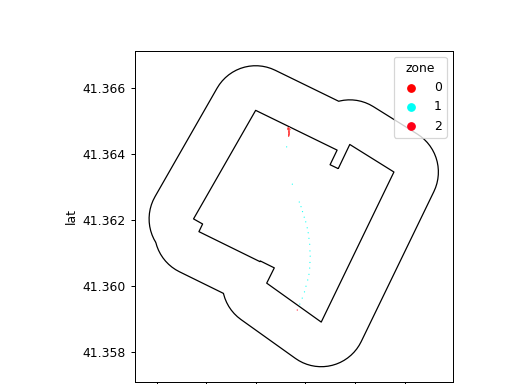

<AxesSubplot:xlabel='lon', ylabel='lat'>

In [24]:
fig, ax = plt.subplots()
dm_buffer_z2.plot(ax = ax, fc = 'none', ec = 'black')
dm_map.plot(ax = ax, fc = 'none', ec = 'black')
sns.scatterplot(data = dfA_n2.loc[289:478,:], x = 'lon',y = 'lat', s = 1, hue = 'zone', palette = 'hsv')

# MMSI: 247383500, index: 289:478

<IPython.core.display.Javascript object>


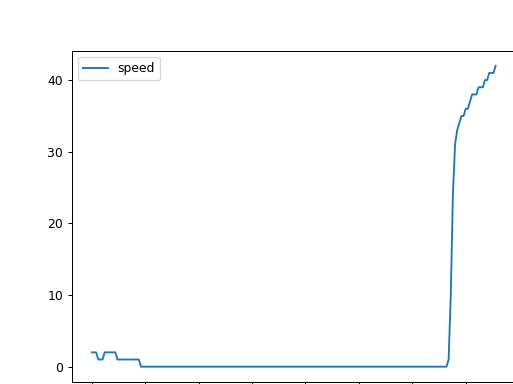

<AxesSubplot:xlabel='time_stamp'>

In [25]:
dfA_n2.loc[289:478,:].plot(kind='line', x='time_stamp', y='speed')

In [30]:
dfA_n2['aturat'].replace(np.nan, 0, inplace=True)

<IPython.core.display.Javascript object>


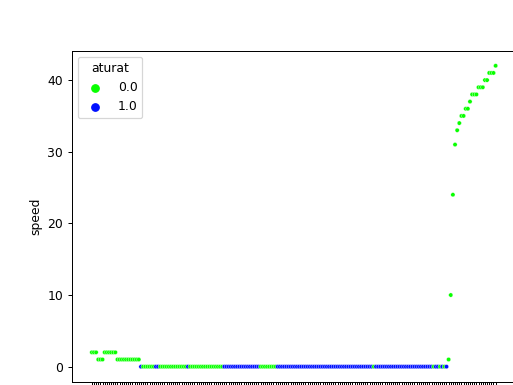

<AxesSubplot:xlabel='time_stamp', ylabel='speed'>

In [31]:
sns.scatterplot(data = dfA_n2.loc[289:478,:], x = 'time_stamp',y = 'speed', s = 12, hue = 'aturat', palette = 'hsv')

<IPython.core.display.Javascript object>


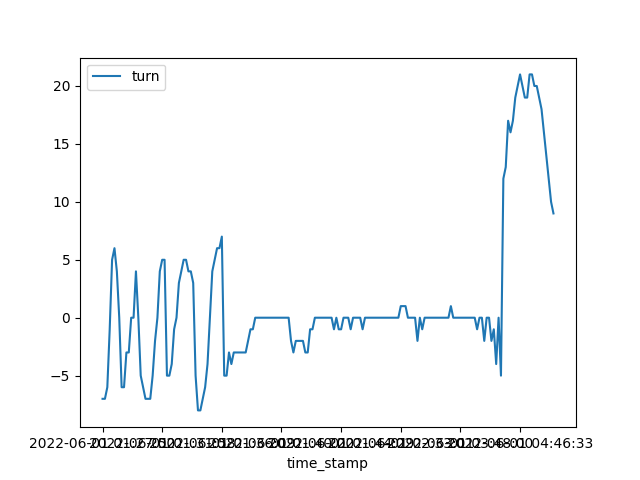

<AxesSubplot:xlabel='time_stamp'>

In [37]:
dfA_n2.loc[289:478,:].plot(kind='line', x='time_stamp', y='turn')

<IPython.core.display.Javascript object>


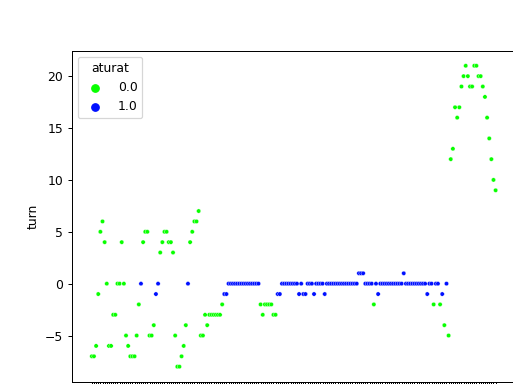

<AxesSubplot:xlabel='time_stamp', ylabel='turn'>

In [32]:
sns.scatterplot(data = dfA_n2.loc[289:478,:], x = 'time_stamp',y = 'turn', s = 12, hue = 'aturat', palette = 'hsv')

<IPython.core.display.Javascript object>


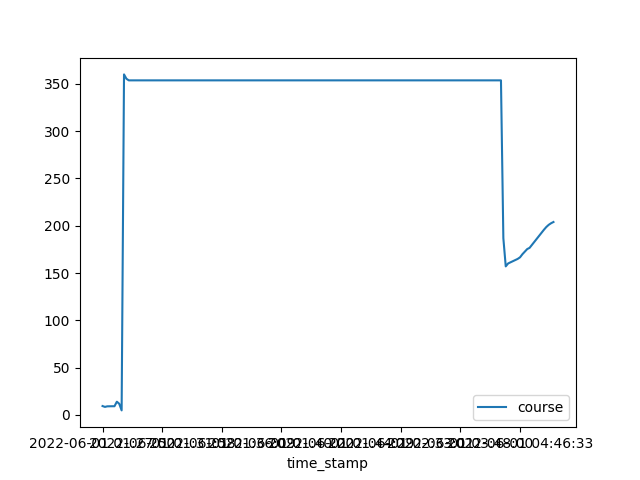

<AxesSubplot:xlabel='time_stamp'>

In [38]:
dfA_n2.loc[289:478,:].plot(kind='line', x='time_stamp', y='course')

<IPython.core.display.Javascript object>


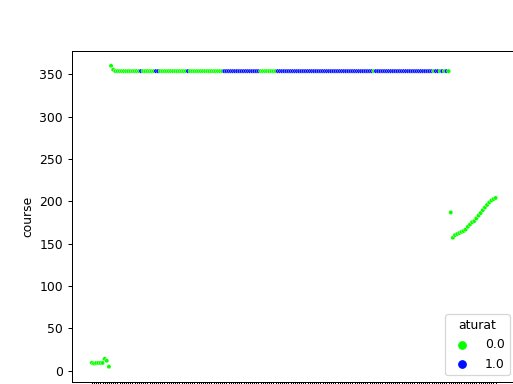

<AxesSubplot:xlabel='time_stamp', ylabel='course'>

In [38]:
sns.scatterplot(data = dfA_n2.loc[289:478,:], x = 'time_stamp',y = 'course', s = 12, hue = 'aturat', palette = 'hsv')

<IPython.core.display.Javascript object>


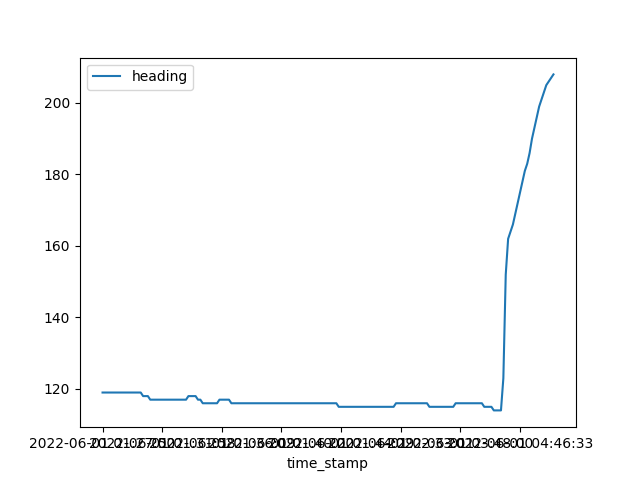

<AxesSubplot:xlabel='time_stamp'>

In [39]:
dfA_n2.loc[289:478,:].plot(kind='line', x='time_stamp', y='heading')

<IPython.core.display.Javascript object>


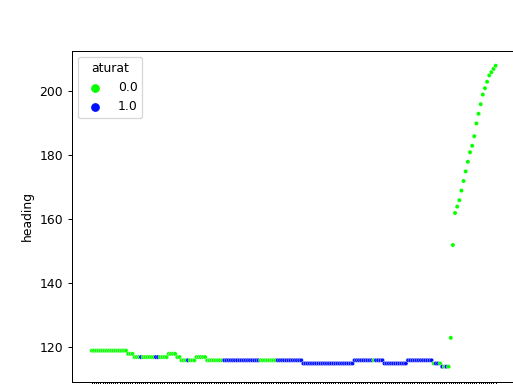

<AxesSubplot:xlabel='time_stamp', ylabel='heading'>

In [37]:
sns.scatterplot(data = dfA_n2.loc[289:478,:], x = 'time_stamp',y = 'heading', s = 12, hue = 'aturat', palette = 'hsv')

# MMSI: 247383500, index: 6078:6538

<IPython.core.display.Javascript object>


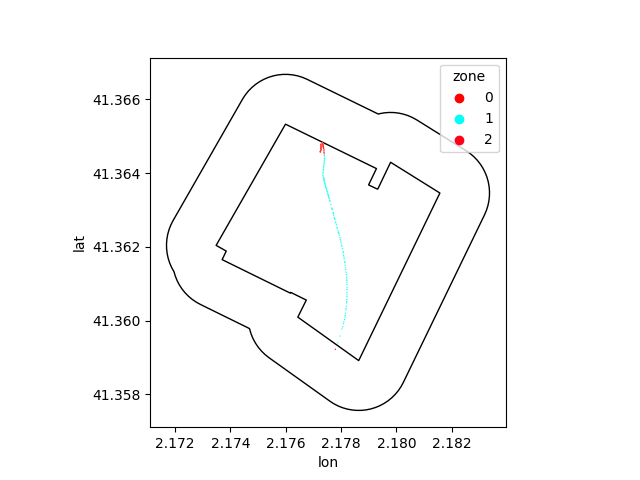

<AxesSubplot:xlabel='lon', ylabel='lat'>

In [41]:
fig, ax = plt.subplots()
dm_buffer_z2.plot(ax = ax, fc = 'none', ec = 'black')
dm_map.plot(ax = ax, fc = 'none', ec = 'black')
sns.scatterplot(data = dfA_n2.loc[6078:6538,:], x = 'lon',y = 'lat', s = 1, hue = 'zone', palette = 'hsv')

<IPython.core.display.Javascript object>


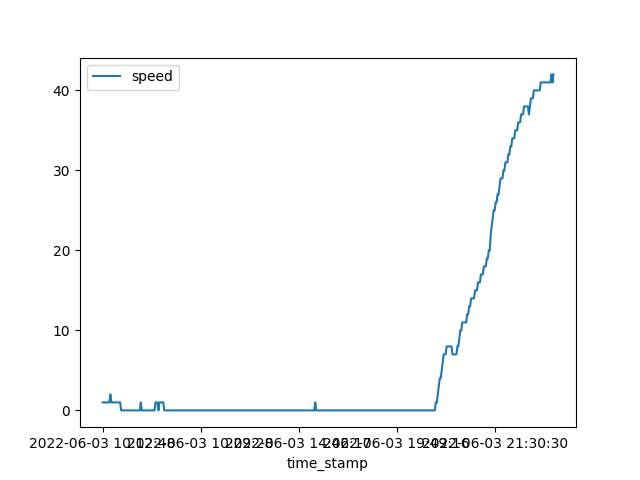

<AxesSubplot:xlabel='time_stamp'>

In [42]:
dfA_n2.loc[6078:6538,:].plot(kind='line', x='time_stamp', y='speed')

<IPython.core.display.Javascript object>


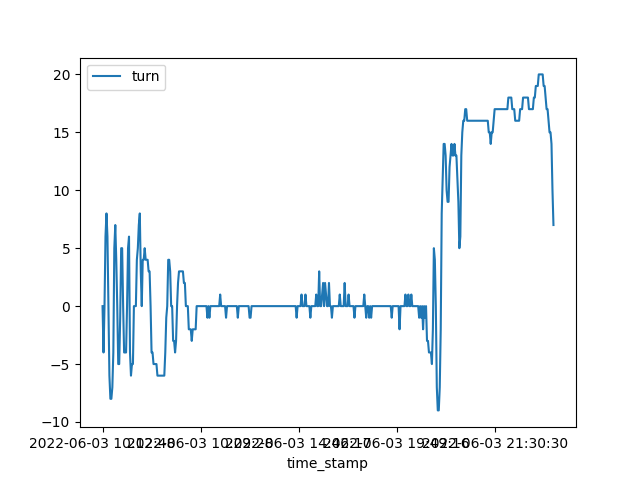

<AxesSubplot:xlabel='time_stamp'>

In [43]:
dfA_n2.loc[6078:6538,:].plot(kind='line', x='time_stamp', y='turn')

<IPython.core.display.Javascript object>


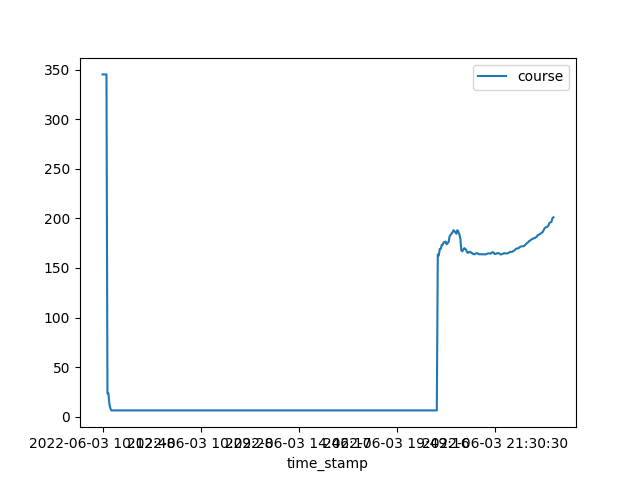

<AxesSubplot:xlabel='time_stamp'>

In [44]:
dfA_n2.loc[6078:6538,:].plot(kind='line', x='time_stamp', y='course')

<IPython.core.display.Javascript object>


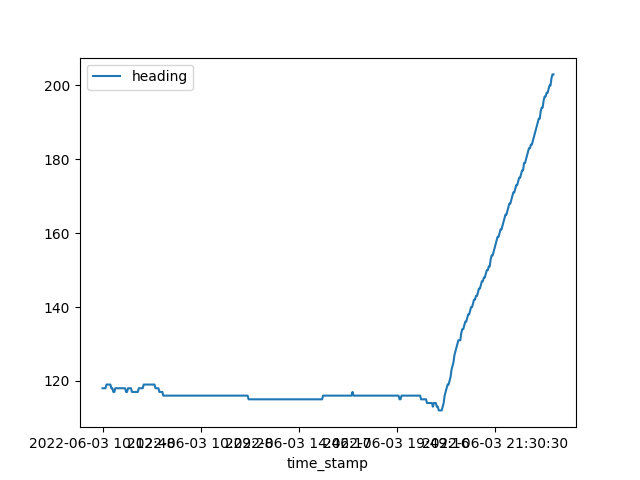

<AxesSubplot:xlabel='time_stamp'>

In [45]:
dfA_n2.loc[6078:6538,:].plot(kind='line', x='time_stamp', y='heading')

# SMALL FUNCTION TEST

In [46]:
def fortest (df):
    dft=df.loc[(df['entsort']=='ent')|(df['entsort']=='sort') ,:].copy()
    for elm in range (0, df.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        
        print(str(df.loc[0,'mmsi'])str(r1)+':'+str(r2)+' '+'SPEED')
        dfA_n2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')
        
        print(str(r1)+':'+str(r2)+' '+'TURN')
        dfA_n2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')
        
        print(str(r1)+':'+str(r2)+' '+'COURSE')
        dfA_n2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='course')

# TODOS LOS SPEEDS

289:478 SPEED


<IPython.core.display.Javascript object>


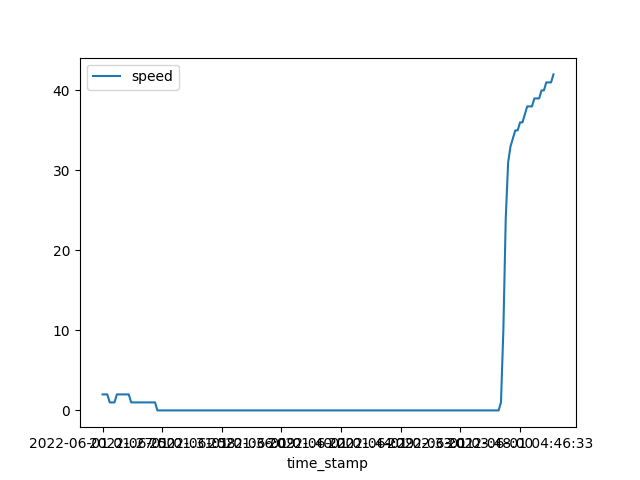

6078:6538 SPEED


<IPython.core.display.Javascript object>


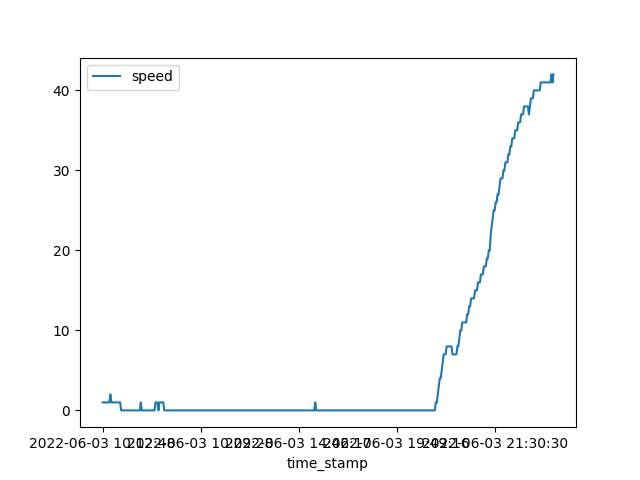

11994:12193 SPEED


<IPython.core.display.Javascript object>


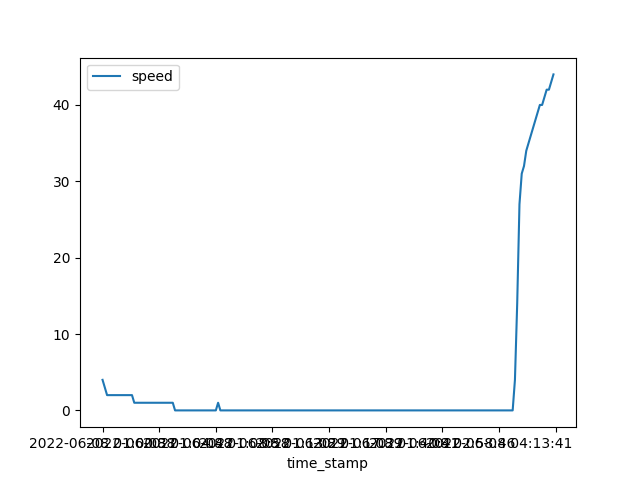

15592:15875 SPEED


<IPython.core.display.Javascript object>


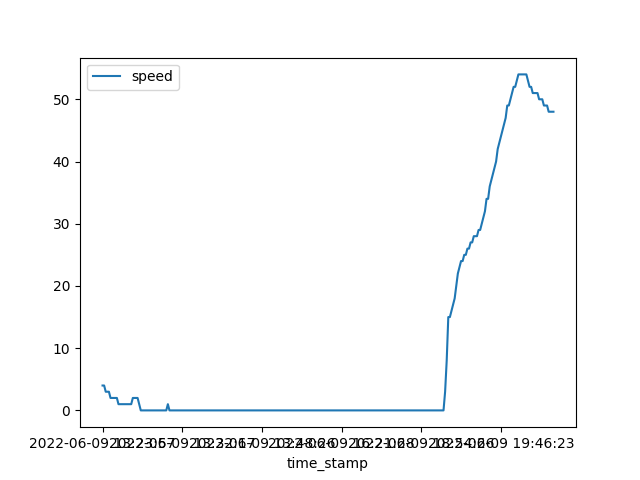

31014:31268 SPEED


<IPython.core.display.Javascript object>


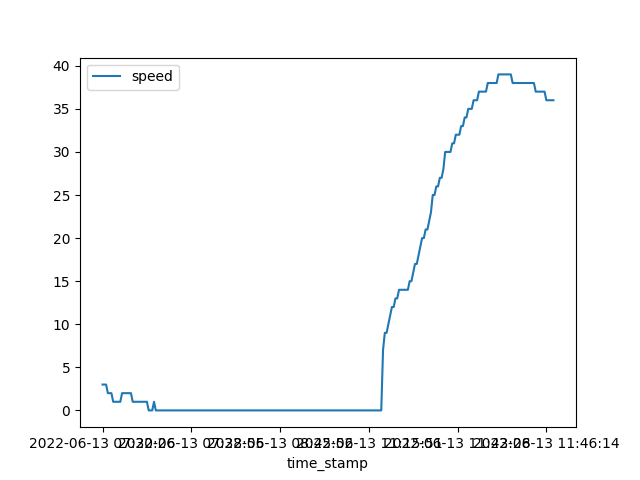

33229:33522 SPEED


<IPython.core.display.Javascript object>


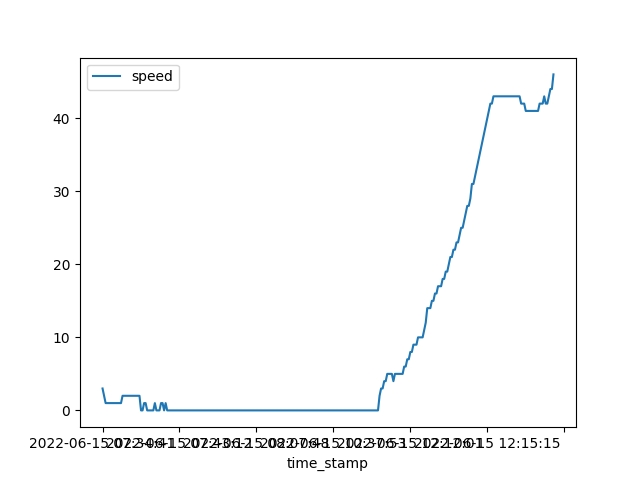

38562:38832 SPEED


<IPython.core.display.Javascript object>


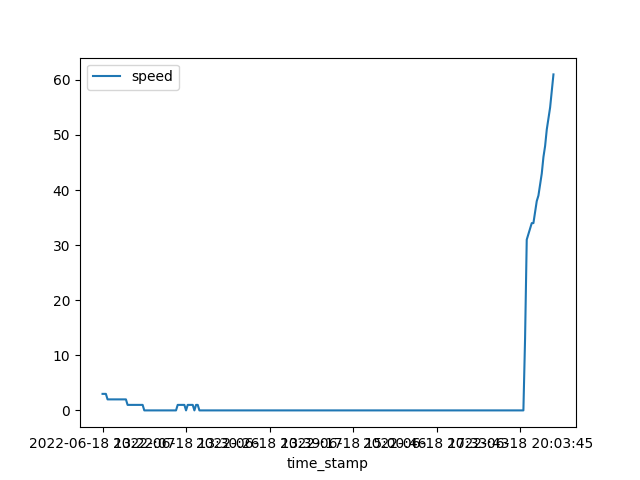

41211:41431 SPEED


<IPython.core.display.Javascript object>


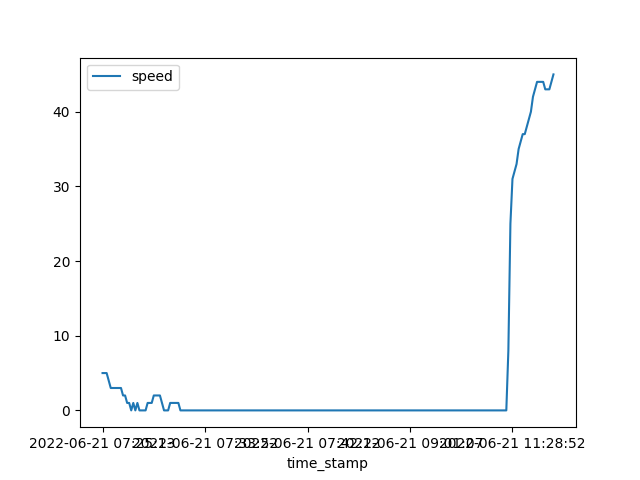

46755:46996 SPEED


<IPython.core.display.Javascript object>


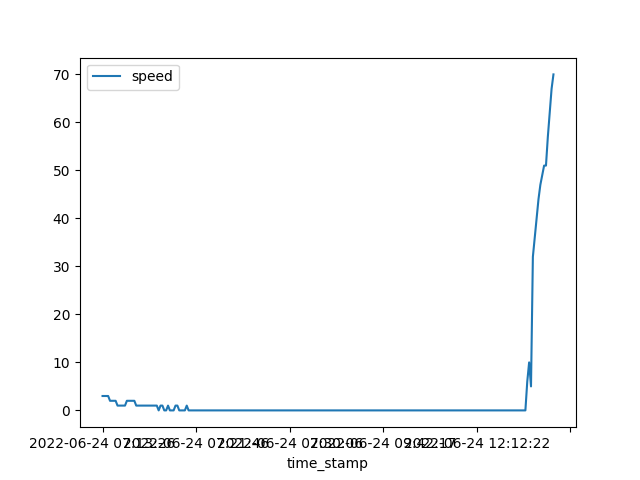

50238:50499 SPEED


<IPython.core.display.Javascript object>


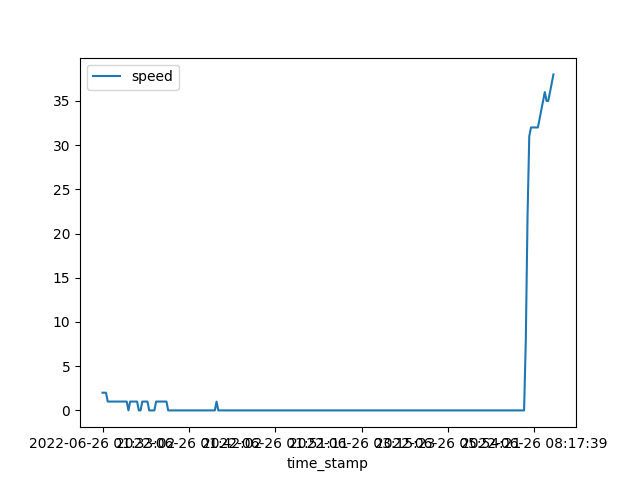

56708:57073 SPEED


<IPython.core.display.Javascript object>


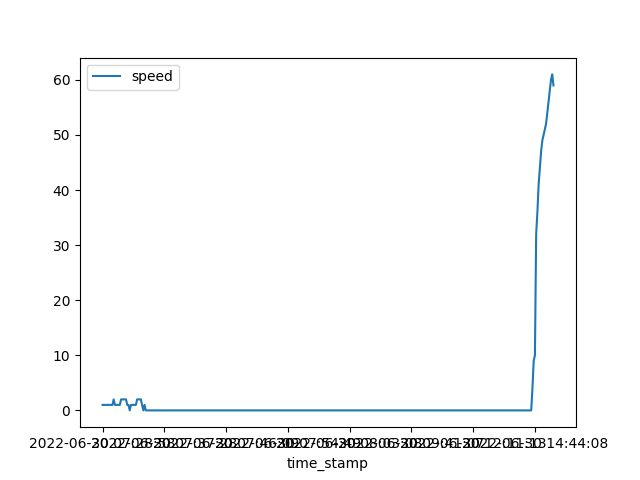

In [97]:
dft=dfA_n2.loc[(dfA_n2['entsort']=='ent')|(dfA_n2['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA_n2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='speed')

# ALL TURNS

289:478 SPEED


<IPython.core.display.Javascript object>


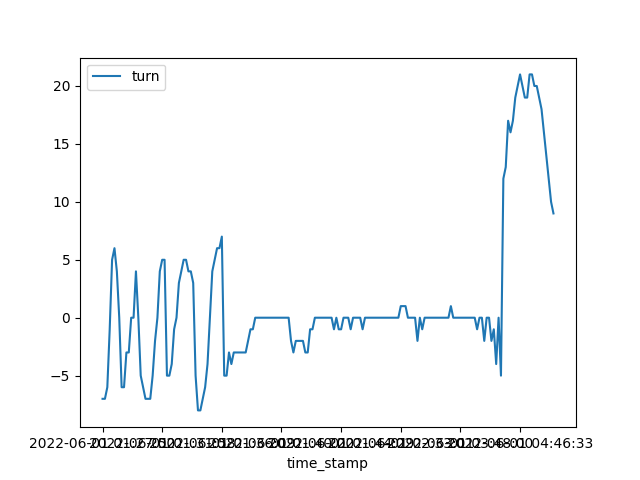

6078:6538 SPEED


<IPython.core.display.Javascript object>


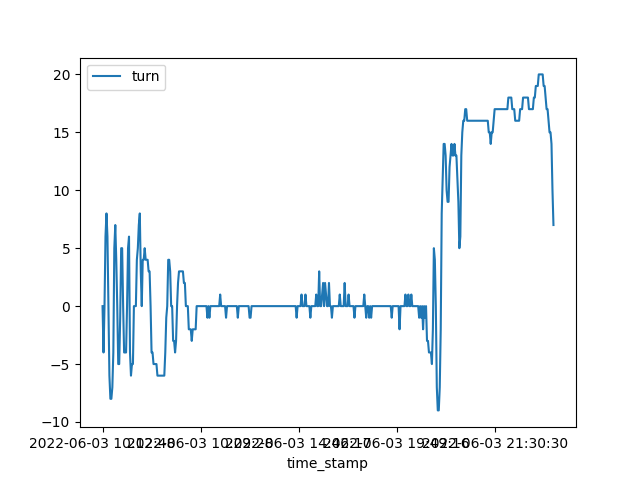

11994:12193 SPEED


<IPython.core.display.Javascript object>


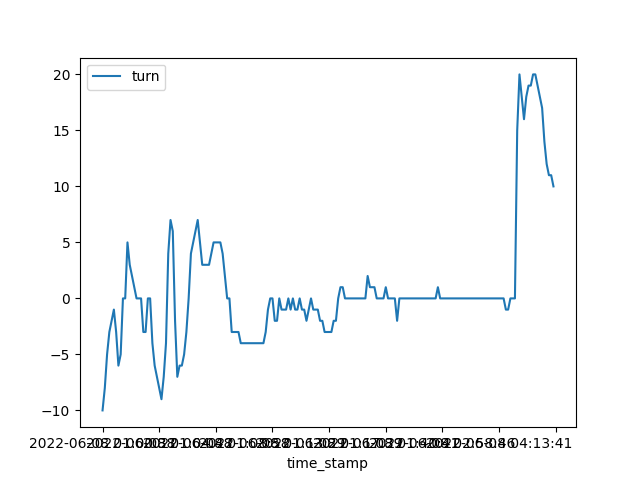

15592:15875 SPEED


<IPython.core.display.Javascript object>


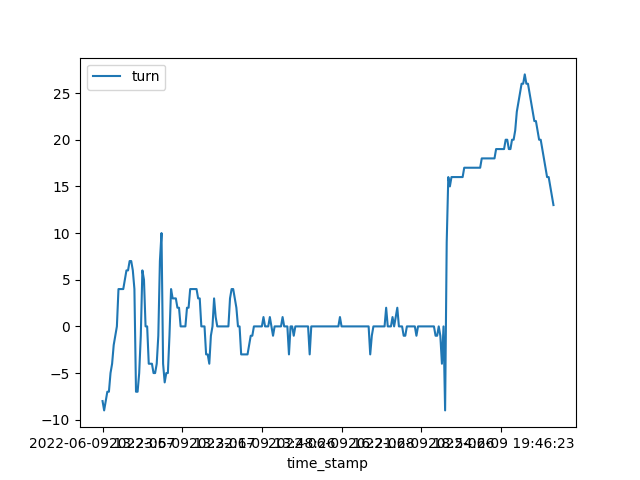

31014:31268 SPEED


<IPython.core.display.Javascript object>


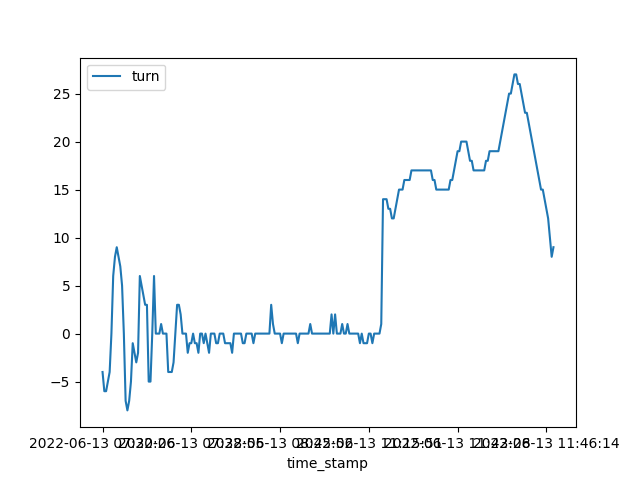

33229:33522 SPEED


<IPython.core.display.Javascript object>


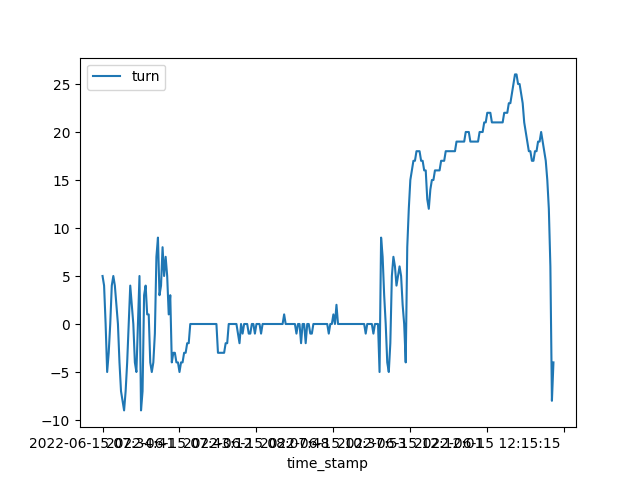

38562:38832 SPEED


<IPython.core.display.Javascript object>


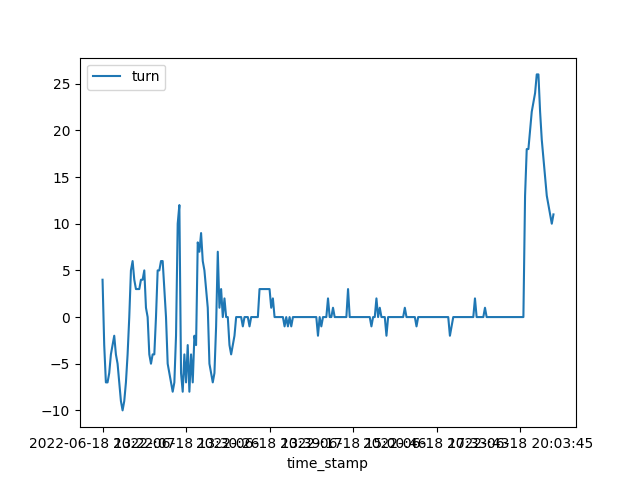

41211:41431 SPEED


<IPython.core.display.Javascript object>


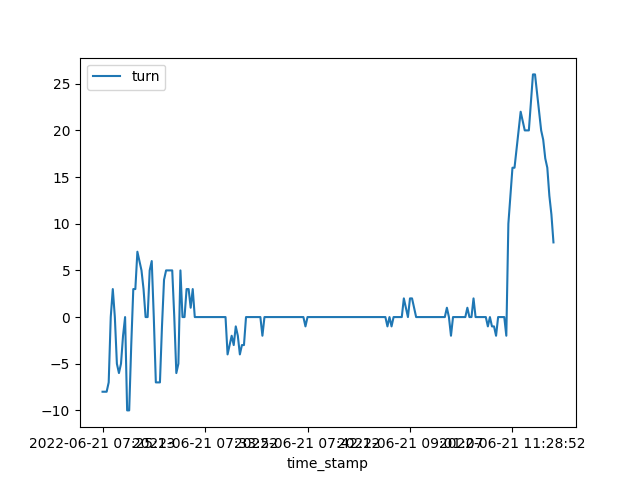

46755:46996 SPEED


<IPython.core.display.Javascript object>


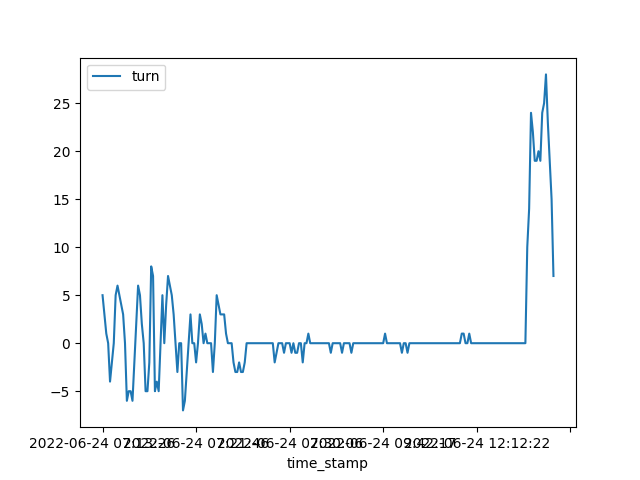

50238:50499 SPEED


<IPython.core.display.Javascript object>


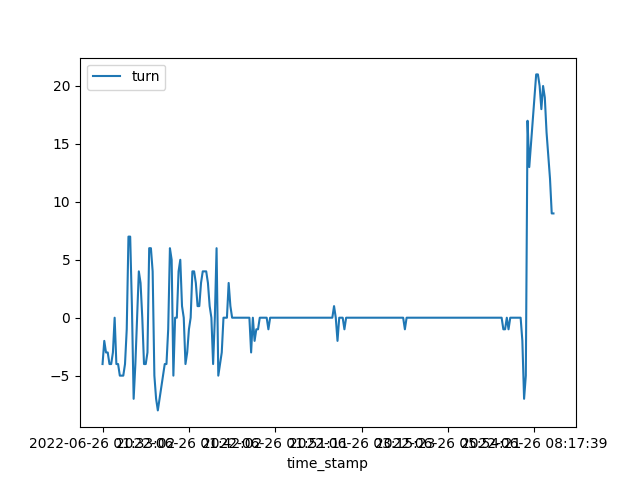

56708:57073 SPEED


<IPython.core.display.Javascript object>


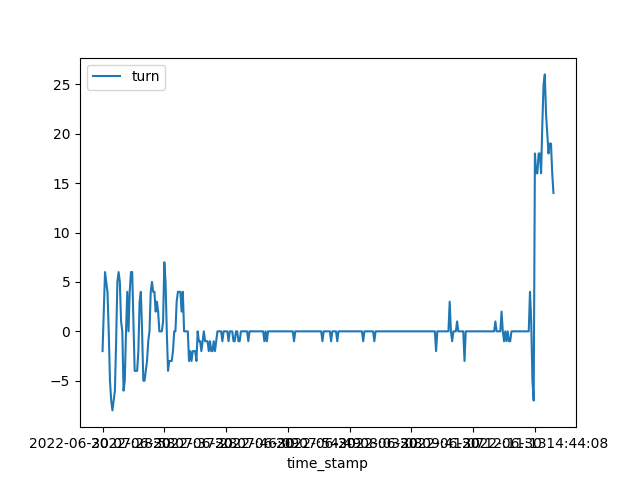

In [98]:
dft=dfA_n2.loc[(dfA_n2['entsort']=='ent')|(dfA_n2['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA_n2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='turn')

# ALL COURSE

289:478 SPEED


<IPython.core.display.Javascript object>


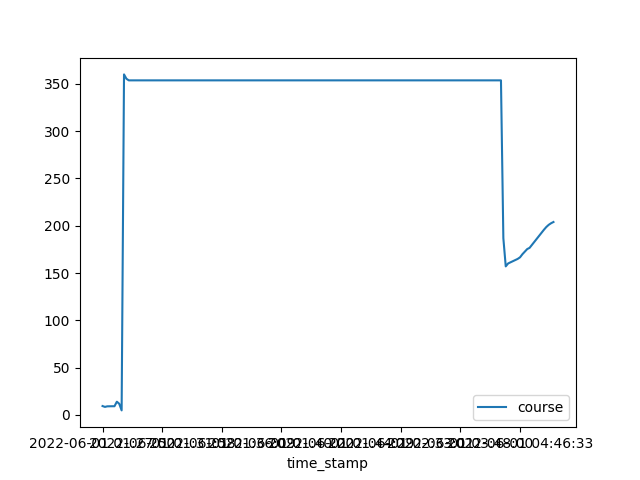

6078:6538 SPEED


<IPython.core.display.Javascript object>


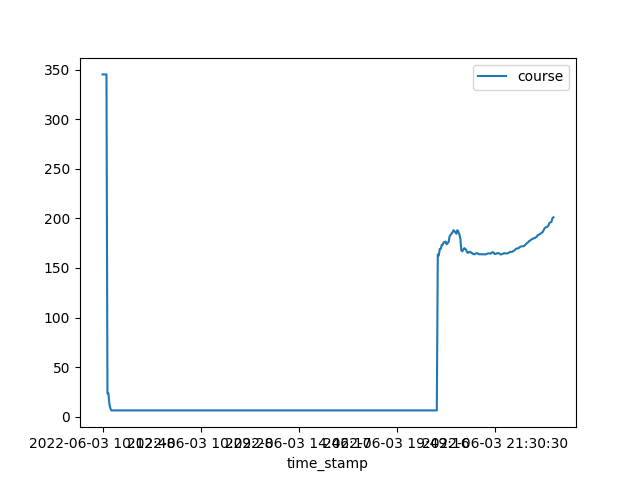

11994:12193 SPEED


<IPython.core.display.Javascript object>


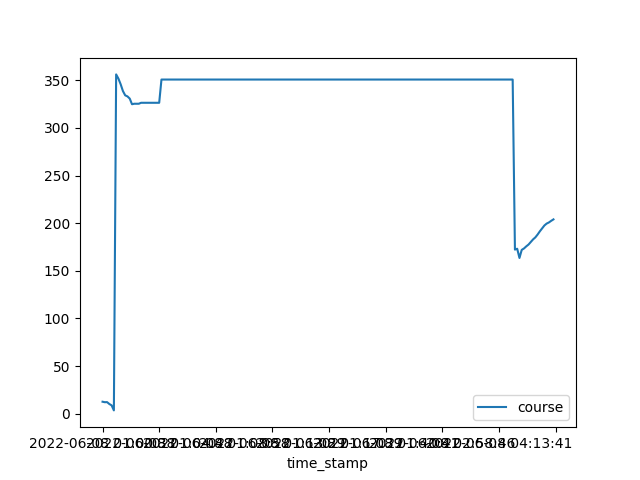

15592:15875 SPEED


<IPython.core.display.Javascript object>


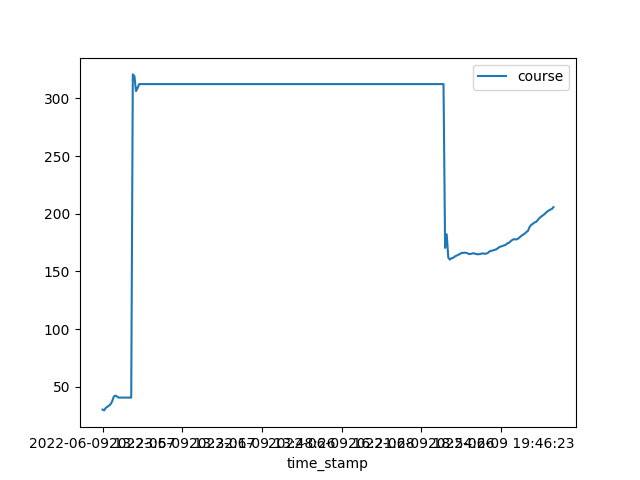

31014:31268 SPEED


<IPython.core.display.Javascript object>


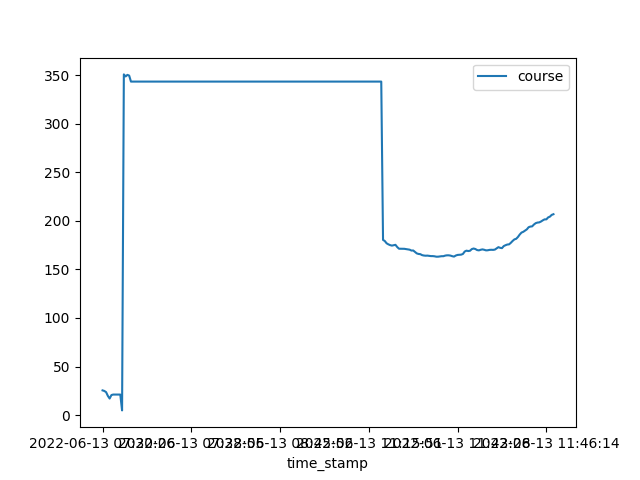

33229:33522 SPEED


<IPython.core.display.Javascript object>


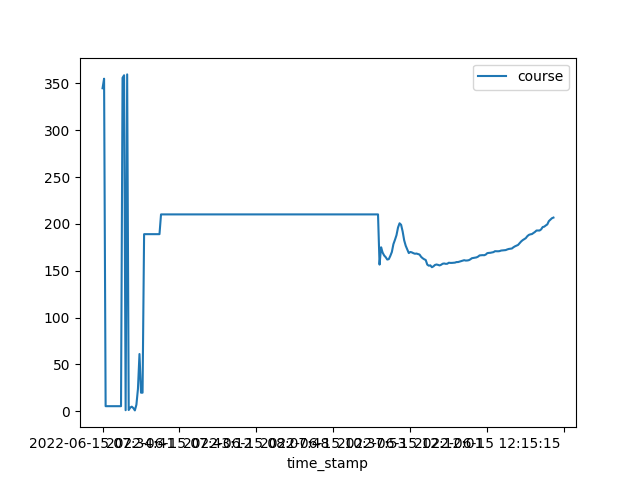

38562:38832 SPEED


<IPython.core.display.Javascript object>


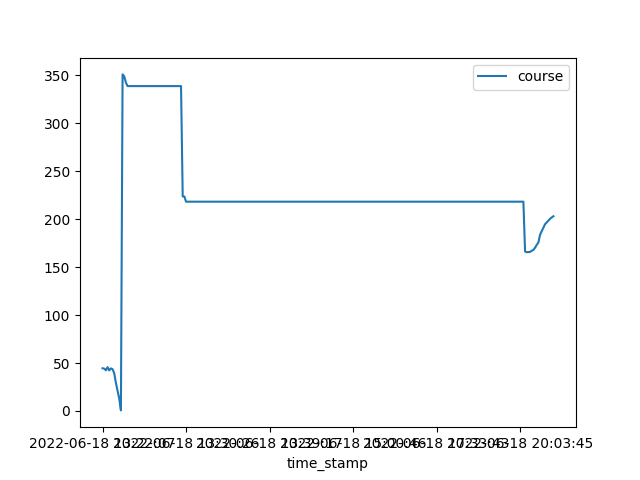

41211:41431 SPEED


<IPython.core.display.Javascript object>


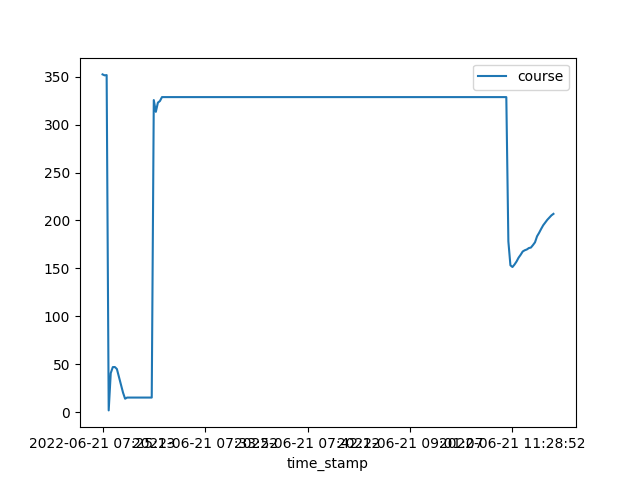

46755:46996 SPEED


<IPython.core.display.Javascript object>


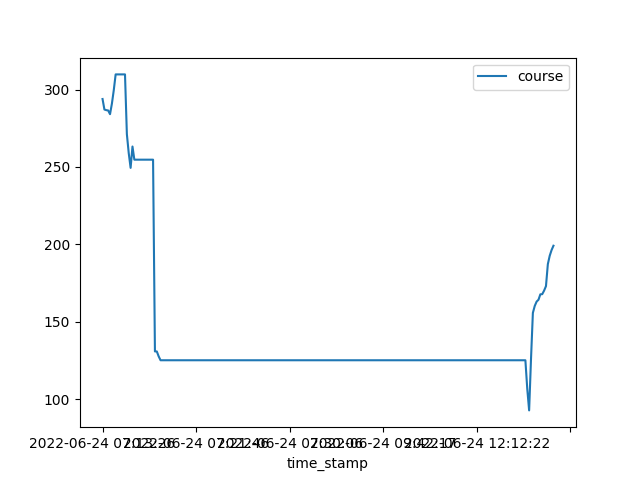

50238:50499 SPEED


<IPython.core.display.Javascript object>


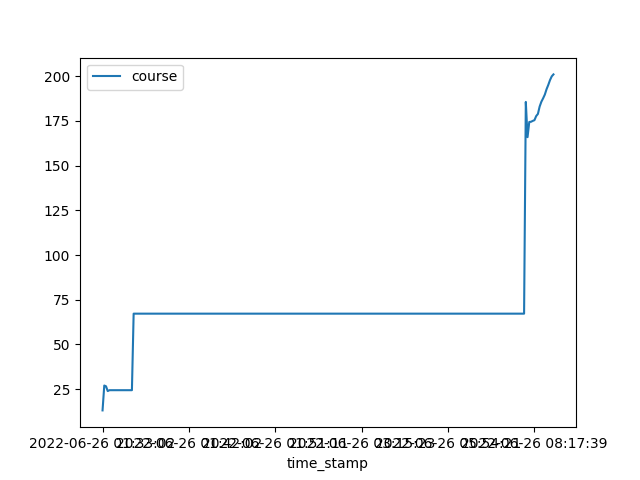

56708:57073 SPEED


<IPython.core.display.Javascript object>


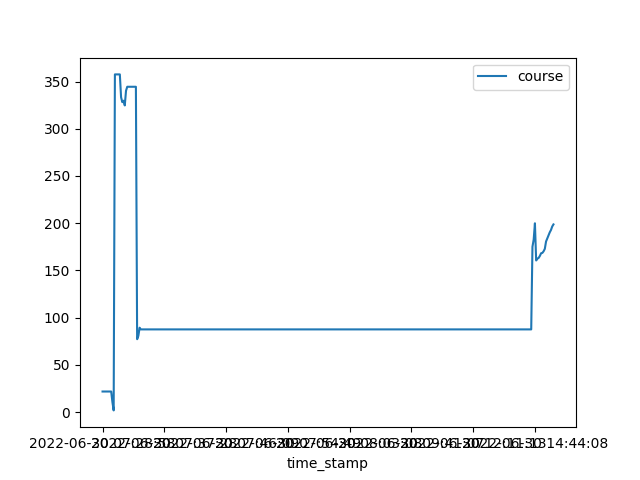

In [99]:
dft=dfA_n2.loc[(dfA_n2['entsort']=='ent')|(dfA_n2['entsort']=='sort') ,:].copy()
for elm in range (0, dft.shape[0], 2):
        r1=dft.index[elm]
        r2=dft.index[elm+1]
        print(str(r1)+':'+str(r2)+' '+'SPEED')
        dfA_n2.loc[r1:r2,:].plot(kind='line', x='time_stamp', y='course')

# PRUEBAS PARA FILTRAR APARCADO

In [21]:
dfA1b1.head()

,time_stamp,mmsi,status,turn,speed,lon,lat,course,heading,day,...,shiptype,draught,to_bow,to_stern,to_starboard,to_port,imo,zone,aturat,entsort
0,2022-06-01 01:03:59,247383500,0,-6.0,34.0,2.17667,41.35834,26.1,25.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
1,2022-06-01 01:04:10,247383500,0,-7.0,33.0,2.17678,41.35849,25.9,25.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
2,2022-06-01 01:04:20,247383500,0,-7.0,33.0,2.17686,41.35864,25.5,24.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
3,2022-06-01 01:04:30,247383500,0,-8.0,33.0,2.17695,41.35878,25.3,24.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN
4,2022-06-01 01:04:40,247383500,0,-9.0,32.0,2.17704,41.35892,25.1,23.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,NaN


In [24]:
dfA1b1.shape

(5890, 21)

In [25]:
dfA1b1.loc[(dfA1b1['entsort']=='ent')|(dfA1b1['entsort']=='sort') ,:]

,time_stamp,mmsi,status,turn,speed,lon,lat,course,heading,day,...,shiptype,draught,to_bow,to_stern,to_starboard,to_port,imo,zone,aturat,entsort
289,2022-06-01 01:27:50,247383500,0,-7.0,2.0,2.17732,41.36455,9.4,119.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,NaN,ent
478,2022-06-01 04:48:52,247383500,5,9.0,42.0,2.17767,41.35928,203.9,208.0,2022-06-01,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,sort
6078,2022-06-03 10:12:48,247383500,0,0.0,1.0,2.17725,41.36457,345.3,118.0,2022-06-03,...,70,7.0,116.0,122.0,27.0,7.0,9859557,0,NaN,ent
6538,2022-06-03 21:34:11,247383500,0,7.0,42.0,2.17779,41.35922,201.1,203.0,2022-06-03,...,70,7.0,116.0,122.0,27.0,7.0,9859557,2,NaN,sort
11994,2022-06-08 01:00:38,247383500,0,-10.0,4.0,2.17745,41.36450,12.6,118.0,2022-06-08,...,74,6.7,116.0,122.0,27.0,7.0,9859557,0,NaN,ent
12193,2022-06-08 04:43:38,247383500,5,10.0,44.0,2.17773,41.35921,204.0,207.0,2022-06-08,...,74,6.7,116.0,122.0,27.0,7.0,9859557,2,NaN,sort
15592,2022-06-09 13:23:57,247383500,0,-8.0,4.0,2.17722,41.36459,30.2,115.0,2022-06-09,...,74,6.6,116.0,122.0,27.0,7.0,9859557,0,NaN,ent
15875,2022-06-09 19:48:17,247383500,0,13.0,48.0,2.17761,41.35941,205.7,210.0,2022-06-09,...,74,6.6,116.0,122.0,27.0,7.0,9859557,2,NaN,sort
31014,2022-06-13 07:30:26,247383500,0,-4.0,3.0,2.17730,41.36455,25.5,115.0,2022-06-13,...,74,7.0,116.0,122.0,27.0,7.0,9859557,0,NaN,ent
31268,2022-06-13 11:46:52,247383500,0,9.0,36.0,2.17753,41.35941,206.8,208.0,2022-06-13,...,74,7.0,116.0,122.0,27.0,7.0,9859557,2,NaN,sort


In [52]:
dfA1b1['time_stamp'] = pd.to_datetime(dfA1b1['time_stamp'])

In [55]:
dfA1b1['time_stamp'][289] - dfA1b1['time_stamp'][478]

Timedelta('-1 days +20:38:58')

<IPython.core.display.Javascript object>


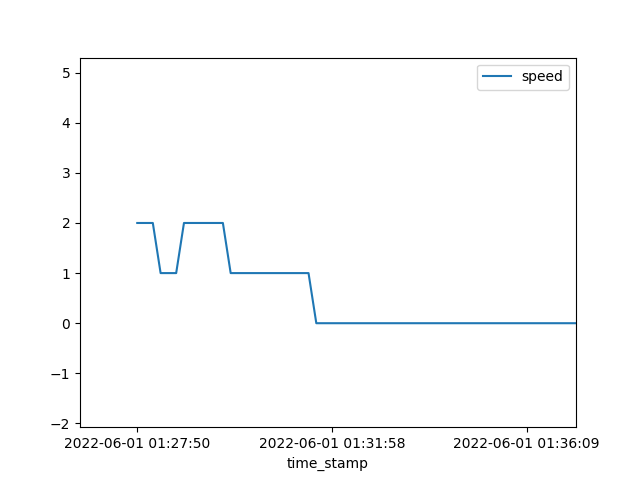

<AxesSubplot:xlabel='time_stamp'>

In [57]:
dfA_n2.loc[289:478,:].plot(kind='line', x='time_stamp', y='speed')